## Project:

Business Objective:

The fundamental goal here is to model the CO2 emissions as a function of several car engine features.

Data Set Details: 

The file contains the data for this example. Here the number of variables (columns) is 12, and the number of instances (rows) is 7385. In that way, this problem has the 12 

following variables:

make, car brand under study.
model, the specific model of the car.
vehicle_class, car body type of the car.
engine_size, size of the car engine, in Liters.
cylinders, number of cylinders.
transmission, "A" for`Automatic', "AM" for ``Automated manual', "AS" for 'Automatic with select shift', "AV" for 'Continuously variable', "M" for 'Manual'.
fuel_type, "X" for 'Regular gasoline', "Z" for 'Premium gasoline', "D" for 'Diesel', "E" for 'Ethanol (E85)', "N" for 'Natural gas'.
fuel_consumption_city, City fuel consumption ratings, in liters per 100 kilometers.
fuel_consumption_hwy, Highway fuel consumption ratings, in liters per 100 kilometers.
fuel_consumption_comb(l/100km), the combined fuel consumption rating (55% city, 45% highway), in L/100 km.
fuel_consumption_comb(mpg), the combined fuel consumption rating (55% city, 45% highway), in miles per gallon (mpg).
co2_emissions, the tailpipe emissions of carbon dioxide for combined city and highway driving, in grams per kilometer.

Acceptance Criterion: Need to deploy the end results using Flask /Streamlit etc

In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import chi2_contingency
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler,MinMaxScaler,LabelEncoder ,PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split,GridSearchCV ,RandomizedSearchCV ,cross_val_score ,KFold
from sklearn.linear_model import LinearRegression ,Lasso ,Ridge , ElasticNet 
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR 
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error,r2_score
import warnings
warnings.filterwarnings("ignore")
import statsmodels.api as sm
import plotly.graph_objects as go



# **EDA (Exploratory Data Analysis)**

**Understand the dataset by summarizing, visualizing, and identifying patterns, correlations, and anomalies.**

## Load Data

In [2]:
#read the dataset
data = pd.read_csv('co2_emissions (1).csv')

In [3]:
## Basic Information & Summary

In [4]:
#Display first 5 records
data.head()

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
0,ACURA,ILX,COMPACT,2.0,4,AS,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS,Z,12.1,8.7,10.6,27,244


In [5]:
#dispaly random 5 sample
data.sample(5)

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
4563,CHEVROLET,COLORADO ZR2 4WD,PICKUP TRUCK - SMALL,3.6,6,A,X,15.0,13.0,14.1,20,331
3688,FORD,FOCUS (Start/Stop),COMPACT,1.0,3,M,X,7.9,5.9,7.0,40,164
5268,PORSCHE,911 CARRERA S,MINICOMPACT,3.0,6,AM,Z,10.8,8.3,9.7,29,226
628,KIA,SORENTO 4WD,SUV - SMALL,3.3,6,A,X,13.4,9.9,11.8,24,271
3766,GMC,TERRAIN,SUV - SMALL,3.6,6,A,X,14.1,9.7,12.1,23,285


##   Understand the Data

In [6]:
#size of rows and columns
data.shape

(7385, 12)

In [7]:
# Get information about columns types and missing values
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7385 entries, 0 to 7384
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   make                            7385 non-null   object 
 1   model                           7385 non-null   object 
 2   vehicle_class                   7385 non-null   object 
 3   engine_size                     7385 non-null   float64
 4   cylinders                       7385 non-null   int64  
 5   transmission                    7385 non-null   object 
 6   fuel_type                       7385 non-null   object 
 7   fuel_consumption_city           7385 non-null   float64
 8   fuel_consumption_hwy            7385 non-null   float64
 9   fuel_consumption_comb(l/100km)  7385 non-null   float64
 10  fuel_consumption_comb(mpg)      7385 non-null   int64  
 11  co2_emissions                   7385 non-null   int64  
dtypes: float64(4), int64(3), object(5)

In [8]:
# Get basic statistical details of numerical columns
data.describe().T

,count,mean,std,min,25%,50%,75%,max
engine_size,7385.0,3.160068,1.354170,0.9,2.0,3.0,3.7,8.4
cylinders,7385.0,5.615030,1.828307,3.0,4.0,6.0,6.0,16.0
fuel_consumption_city,7385.0,12.556534,3.500274,4.2,10.1,12.1,14.6,30.6
fuel_consumption_hwy,7385.0,9.041706,2.224456,4.0,7.5,8.7,10.2,20.6
fuel_consumption_comb(l/100km),7385.0,10.975071,2.892506,4.1,8.9,10.6,12.6,26.1
fuel_consumption_comb(mpg),7385.0,27.481652,7.231879,11.0,22.0,27.0,32.0,69.0
co2_emissions,7385.0,250.584699,58.512679,96.0,208.0,246.0,288.0,522.0


In [9]:
# Basic statistics summary of Object features
data.describe(include= 'object').T

,count,unique,top,freq
make,7385,42,FORD,628
model,7385,2053,F-150 FFV 4X4,32
vehicle_class,7385,16,SUV - SMALL,1217
transmission,7385,5,AS,3127
fuel_type,7385,5,X,3637


In [10]:
##Get features names
data.columns

Index(['make', 'model', 'vehicle_class', 'engine_size', 'cylinders',
       'transmission', 'fuel_type', 'fuel_consumption_city',
       'fuel_consumption_hwy', 'fuel_consumption_comb(l/100km)',
       'fuel_consumption_comb(mpg)', 'co2_emissions'],
      dtype='object')

In [11]:
# checking duplicate values
data.duplicated().sum()

1112

In [12]:
#check for missing data
data.isnull().sum()

make                              0
model                             0
vehicle_class                     0
engine_size                       0
cylinders                         0
transmission                      0
fuel_type                         0
fuel_consumption_city             0
fuel_consumption_hwy              0
fuel_consumption_comb(l/100km)    0
fuel_consumption_comb(mpg)        0
co2_emissions                     0
dtype: int64

In [13]:
# percentage of missing values
data.isna().sum()/len(data)*100 

make                              0.0
model                             0.0
vehicle_class                     0.0
engine_size                       0.0
cylinders                         0.0
transmission                      0.0
fuel_type                         0.0
fuel_consumption_city             0.0
fuel_consumption_hwy              0.0
fuel_consumption_comb(l/100km)    0.0
fuel_consumption_comb(mpg)        0.0
co2_emissions                     0.0
dtype: float64

## Univariate, Bivariate & Multivariate Analysis 

**Histogram & Barplot**

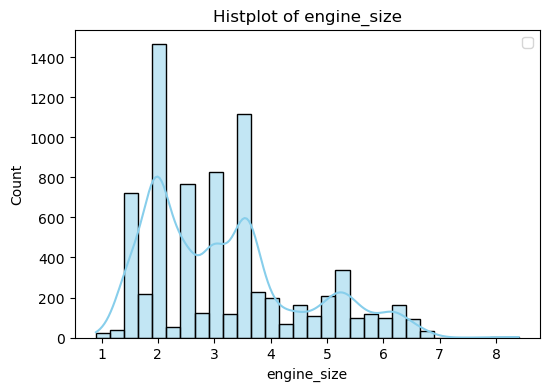

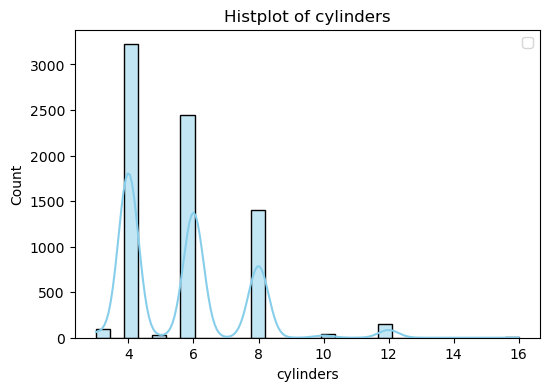

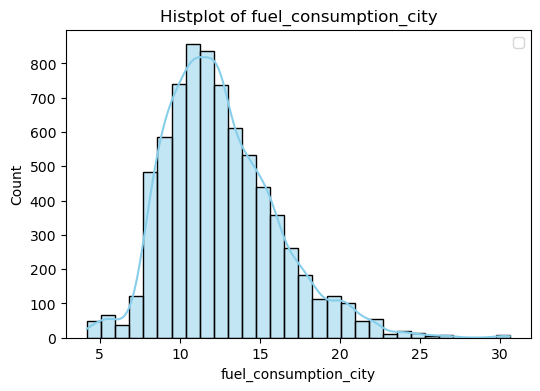

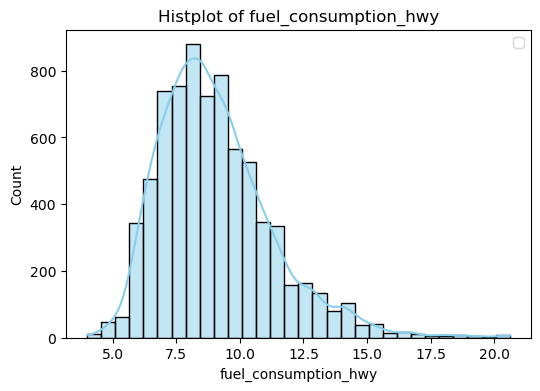

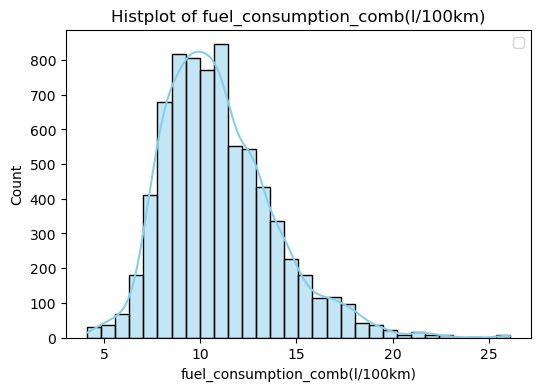

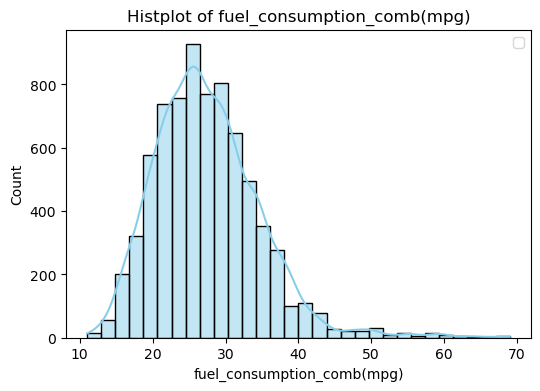

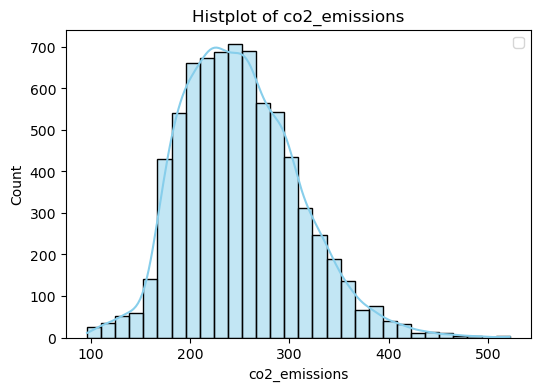

In [14]:
#Check Distribution of Numerical Data
# Select numerical columns
num_col = data.select_dtypes(include=['float64', 'int64']).columns 
# Plot histograms with KDE for each numerical column
for col in num_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(data[col], bins=30, kde=True, color="skyblue")
    plt.title(f'Histplot of {col}')
    plt.legend()
    plt.show()

**Skewness**

In [15]:
# Check skewness of numerical features

# Select only numerical columns
num_col =['engine_size', 'cylinders', 'fuel_consumption_city', 
                      'fuel_consumption_hwy', 'fuel_consumption_comb(l/100km)', 
                      'fuel_consumption_comb(mpg)','co2_emissions'] #data.select_dtypes(include=['float64', 'int64']).columns

# Calculate skewness
skewness_values = data[num_col].skew()

# Display skewness values
print("Skewness of numerical columns:\n", skewness_values)

Skewness of numerical columns:
 engine_size                       0.809181
cylinders                         1.110415
fuel_consumption_city             0.809005
fuel_consumption_hwy              1.079217
fuel_consumption_comb(l/100km)    0.893316
fuel_consumption_comb(mpg)        0.977034
co2_emissions                     0.526094
dtype: float64


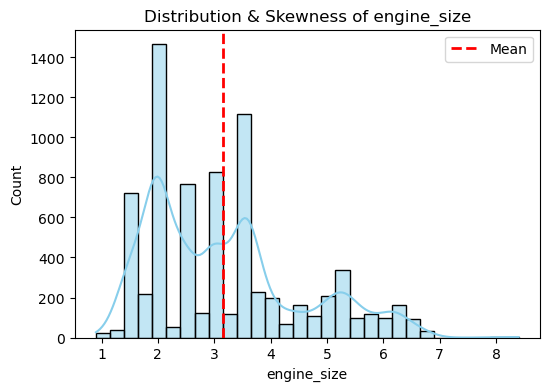

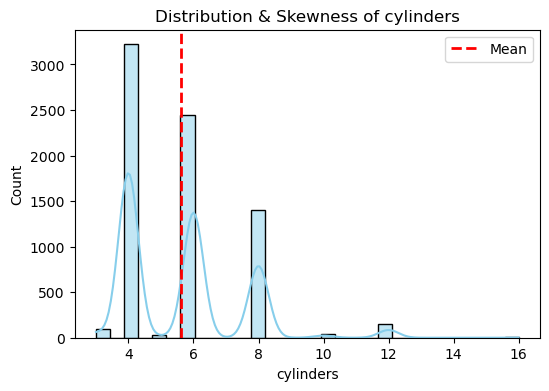

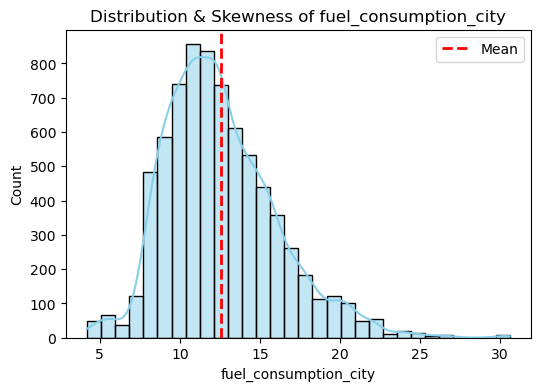

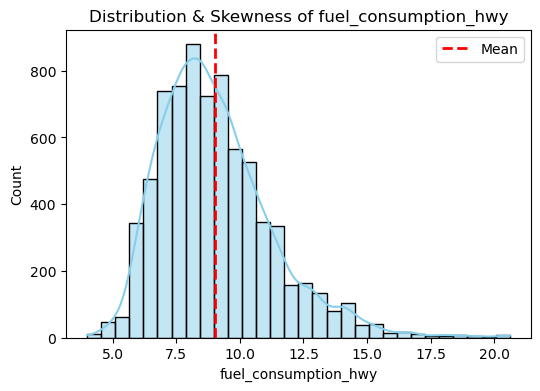

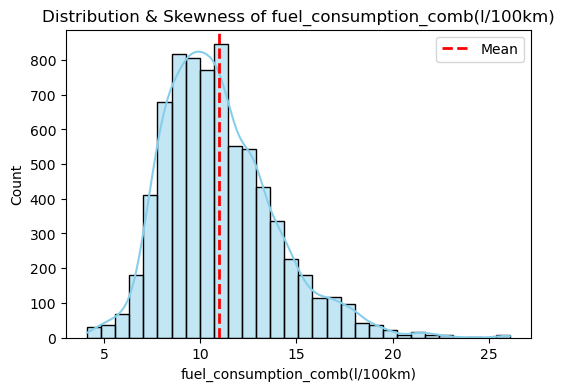

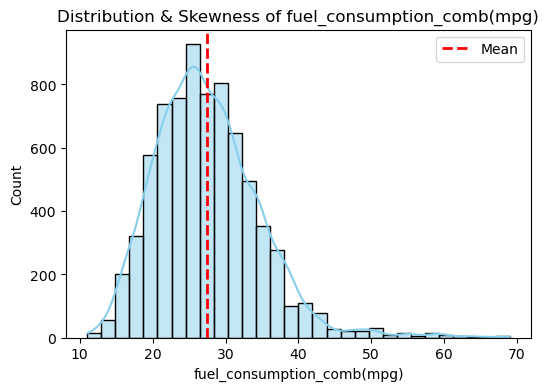

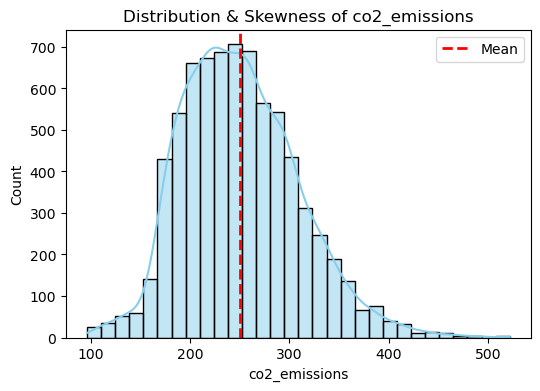

In [16]:
#Identify Sknewness
# Select numerical columns
num_col = data.select_dtypes(include=['float64', 'int64']).columns

# Plot histograms with KDE for each numerical column
for col in num_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(data[col], bins=30, kde=True, color="skyblue")
    plt.title(f'Distribution & Skewness of {col}')
    plt.axvline(data[col].mean(), color='red', linestyle='dashed', linewidth=2, label="Mean")
    plt.legend()
    plt.show()

In [17]:
# Categorical features

In [18]:
#Brands od cars
print("We have total",len(data['make'].unique()),"Car Companies Data")
df_brand = data['make'].value_counts().reset_index().rename(columns={'count':'Count'})
df_brand.head(20)

We have total 42 Car Companies Data


,make,Count
0,FORD,628
1,CHEVROLET,588
2,BMW,527
3,MERCEDES-BENZ,419
4,PORSCHE,376
5,TOYOTA,330
6,GMC,328
7,AUDI,286
8,NISSAN,259
9,JEEP,251


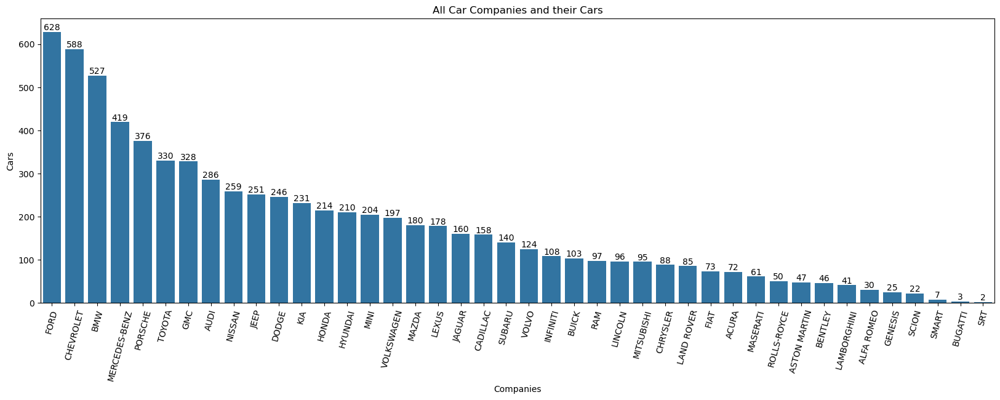

In [19]:
plt.figure(figsize=(20,6))
fig1 = sns.barplot(data = df_brand, x = "make",  y= "Count")
plt.xticks(rotation = 75)
plt.title("All Car Companies and their Cars")
plt.xlabel("Companies")
plt.ylabel("Cars")
plt.bar_label(fig1.containers[0])
plt.show()

In [20]:
#Models of cars 
print("We have total",len(data['model'].unique()),"Car Models")
df_model = data['model'].value_counts().reset_index().rename(columns={'count':'Count'})[:25]
df_model.head(20)

We have total 2053 Car Models


,model,Count
0,F-150 FFV 4X4,32
1,F-150 FFV,32
2,MUSTANG,27
3,FOCUS FFV,24
4,SONIC,20
5,SONIC 5,20
6,F-150 4X4,20
7,F-150,20
8,ACCORD,19
9,COMPASS,19


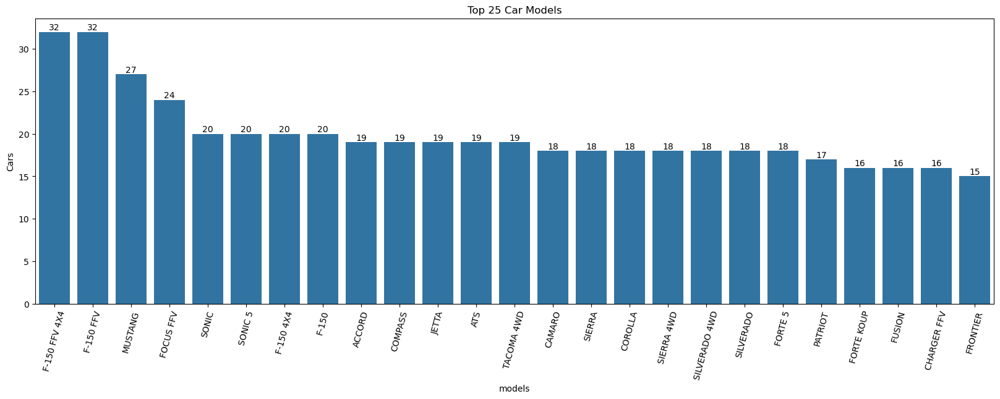

In [21]:
plt.figure(figsize=(20,6))
fig2 = sns.barplot(data = df_model, x = "model",  y= "Count")
plt.xticks(rotation = 75)
plt.title("Top 25 Car Models")
plt.xlabel("models")
plt.ylabel("Cars")
plt.bar_label(fig2.containers[0])
plt.show()

In [22]:
#Vehicle Class
print("We have total",len(data['vehicle_class'].unique()),"vehicle_class")
df_vehicle_class = data['vehicle_class'].value_counts().reset_index().rename(columns={'count':'Count'})
df_vehicle_class

We have total 16 vehicle_class


,vehicle_class,Count
0,SUV - SMALL,1217
1,MID-SIZE,1133
2,COMPACT,1022
3,SUV - STANDARD,735
4,FULL-SIZE,639
5,SUBCOMPACT,606
6,PICKUP TRUCK - STANDARD,538
7,TWO-SEATER,460
8,MINICOMPACT,326
9,STATION WAGON - SMALL,252


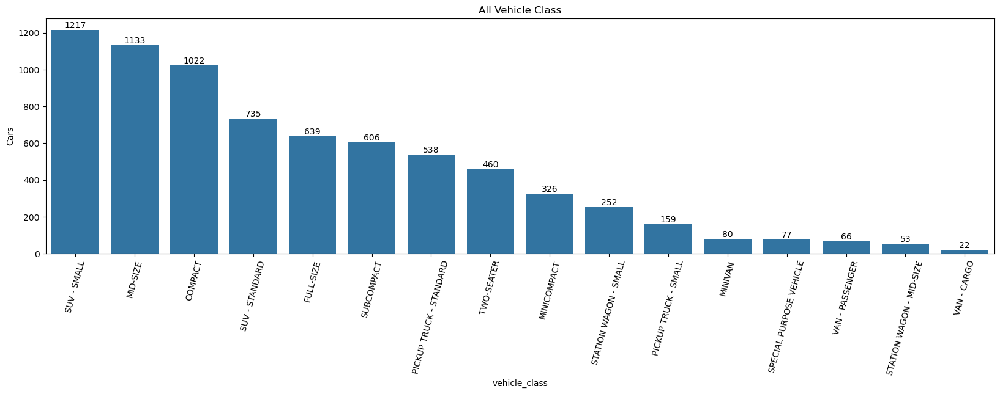

In [23]:
plt.figure(figsize=(20,5))
fig3 = sns.barplot(data = df_vehicle_class, x = "vehicle_class",  y= "Count")
plt.xticks(rotation = 75)
plt.title("All Vehicle Class")
plt.xlabel("vehicle_class")
plt.ylabel("Cars")
plt.bar_label(fig3.containers[0])
plt.show()

In [24]:
#Engine Sizes of cars
print("We have total",len(data['engine_size'].unique()),"Types of Engine Size")
df_engine_size = data['engine_size'].value_counts().reset_index().rename(columns={'count':'Count'})
df_engine_size.head(10)

We have total 51 Types of Engine Size


,engine_size,Count
0,2.0,1460
1,3.0,804
2,3.6,536
3,3.5,529
4,2.5,423
5,2.4,346
6,1.6,302
7,5.3,290
8,1.8,216
9,1.4,211


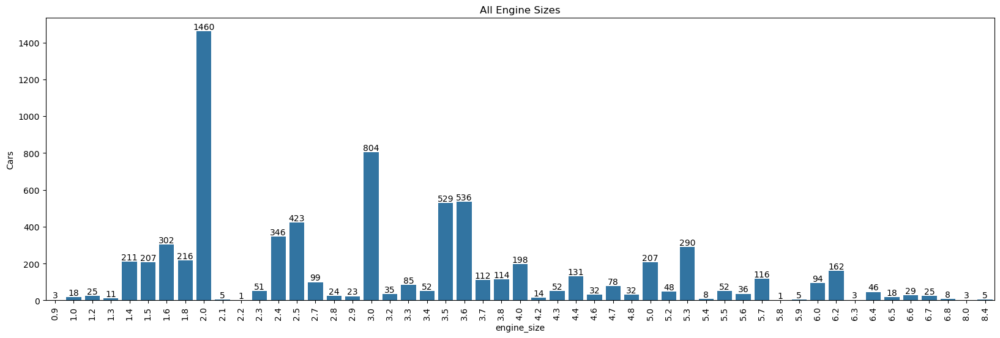

In [25]:
plt.figure(figsize=(20,6))
fig4 = sns.barplot(data = df_engine_size, x = "engine_size",  y= "Count")
plt.xticks(rotation = 90)
plt.title("All Engine Sizes")
plt.xlabel("engine_size")
plt.ylabel("Cars")
plt.bar_label(fig4.containers[0])
plt.show()

In [26]:
#Cylinders
print("We have total",len(data['cylinders'].unique()),"Types of Cylinders")
df_cylinders = data['cylinders'].value_counts().reset_index().rename(columns={'count':'Count'})
df_cylinders.head(10)

We have total 8 Types of Cylinders


,cylinders,Count
0,4,3220
1,6,2446
2,8,1402
3,12,151
4,3,95
5,10,42
6,5,26
7,16,3


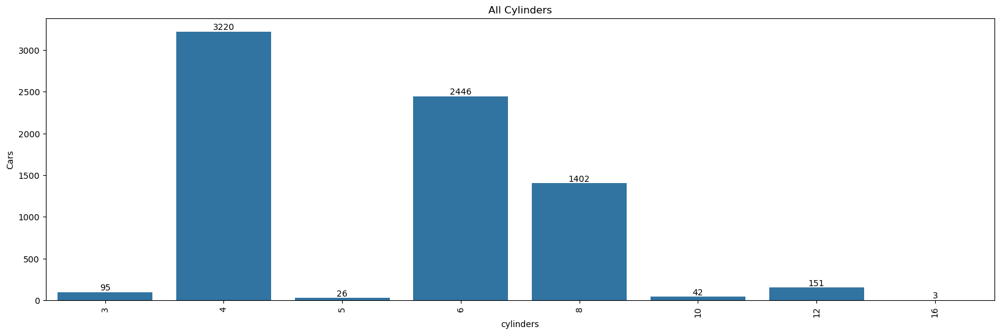

In [27]:
plt.figure(figsize=(20,6))
fig5 = sns.barplot(data = df_cylinders, x = "cylinders",  y= "Count")
plt.xticks(rotation = 90)
plt.title("All Cylinders")
plt.xlabel("cylinders")
plt.ylabel("Cars")
plt.bar_label(fig5.containers[0])
plt.show()

In [28]:
## Transmission of Cars 
data['transmission'].unique()

array(['AS', 'M', 'AV', 'AM', 'A'], dtype=object)

In [29]:
#Here we have to map similar labels into a single label for our Transmission column.
data["transmission"] = np.where(data["transmission"].isin(["A"]), "Automatic", data["transmission"])
data["transmission"] = np.where(data["transmission"].isin(["AM"]), "Automated Manual", data["transmission"])
data["transmission"] = np.where(data["transmission"].isin(["AS"]), "Automatic with Select Shift", data["transmission"])
data["transmission"] = np.where(data["transmission"].isin(["AV"]), "Continuously Variable", data["transmission"])
data["transmission"] = np.where(data["transmission"].isin(["M"]), "Manual", data["transmission"])

In [30]:
print("We have total",len(data['transmission'].unique()),"transmissions")
df_transmission = data['transmission'].value_counts().reset_index().rename(columns={'count':'Count'})
df_transmission

We have total 5 transmissions


,transmission,Count
0,Automatic with Select Shift,3127
1,Automatic,1851
2,Manual,1185
3,Automated Manual,646
4,Continuously Variable,576


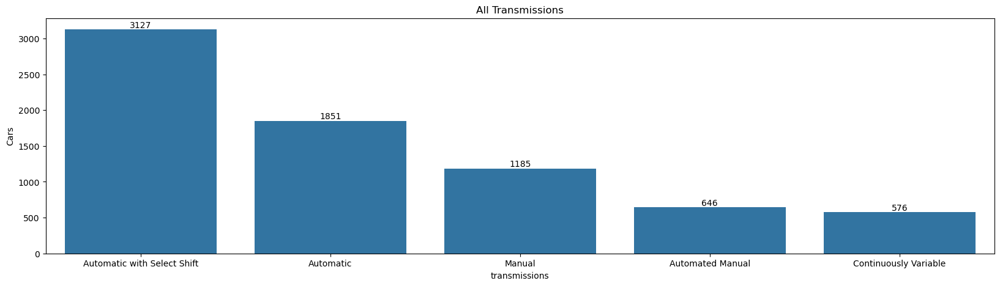

In [31]:
plt.figure(figsize=(20,5))
fig6 = sns.barplot(data = df_transmission, x = "transmission",  y= "Count")
plt.title("All Transmissions")
plt.xlabel("transmissions")
plt.ylabel("Cars")
plt.bar_label(fig6.containers[0])
plt.show()

In [32]:
#Fuel Type of Cars
data['fuel_type'].unique()

array(['Z', 'D', 'X', 'E', 'N'], dtype=object)

In [33]:
#Here we have to map similar labels into a single label for our Fuel Type column
data["fuel_type"] = np.where(data["fuel_type"]=="Z", "Premium Gasoline", data["fuel_type"])
data["fuel_type"] = np.where(data["fuel_type"]=="X", "Regular Gasoline", data["fuel_type"])
data["fuel_type"] = np.where(data["fuel_type"]=="D", "Diesel", data["fuel_type"])
data["fuel_type"] = np.where(data["fuel_type"]=="E", "Ethanol(E85)", data["fuel_type"])
data["fuel_type"] = np.where(data["fuel_type"]=="N", "Natural Gas", data["fuel_type"])

In [34]:
print("We have total",len(data['fuel_type'].unique()),"fuel_type")
df_fuel_type = data['fuel_type'].value_counts().reset_index().rename(columns={'count':'Count'})
df_fuel_type

We have total 5 fuel_type


,fuel_type,Count
0,Regular Gasoline,3637
1,Premium Gasoline,3202
2,Ethanol(E85),370
3,Diesel,175
4,Natural Gas,1


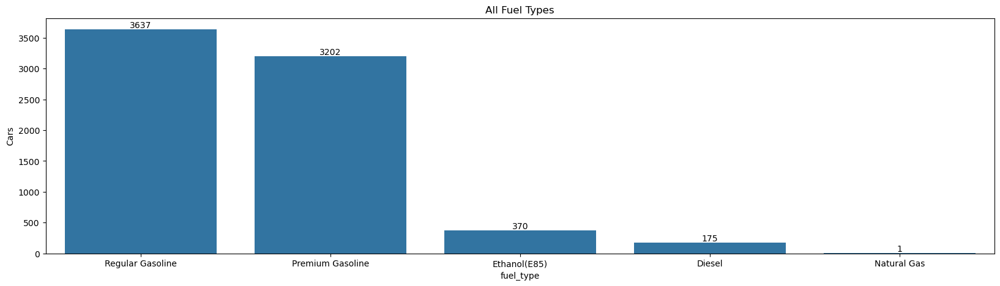

In [35]:
plt.figure(figsize=(20,5))
fig7 = sns.barplot(data = df_fuel_type, x = "fuel_type",  y= "Count")
plt.title("All Fuel Types")
plt.xlabel("fuel_type")
plt.ylabel("Cars")
plt.bar_label(fig7.containers[0])
plt.show()

### Variation in CO2 emissions with different features

### Co2 Emission with Brand

In [36]:
df_co2_make = data.groupby(['make'])['co2_emissions'].mean().sort_values().reset_index()

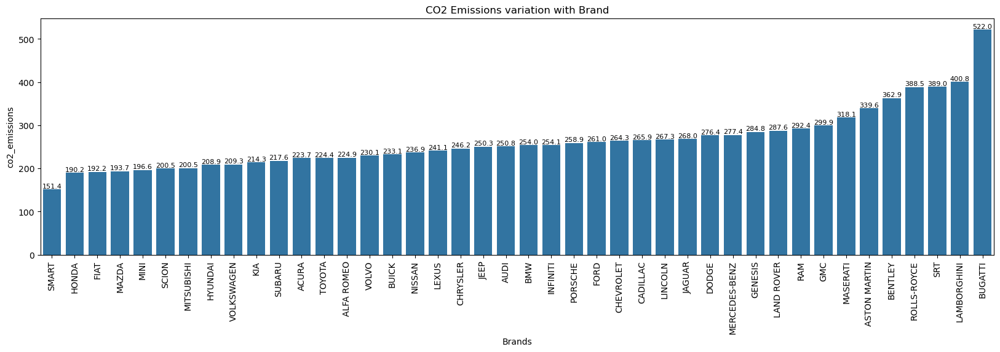

In [37]:
plt.figure(figsize=(20,5))
fig8 = sns.barplot(data = df_co2_make, x = "make",  y= "co2_emissions")
plt.xticks(rotation = 90)
plt.title("CO2 Emissions variation with Brand")
plt.xlabel("Brands")
plt.ylabel("co2_emissions")
plt.bar_label(fig8.containers[0], fontsize=8, fmt='%.1f')
plt.show()

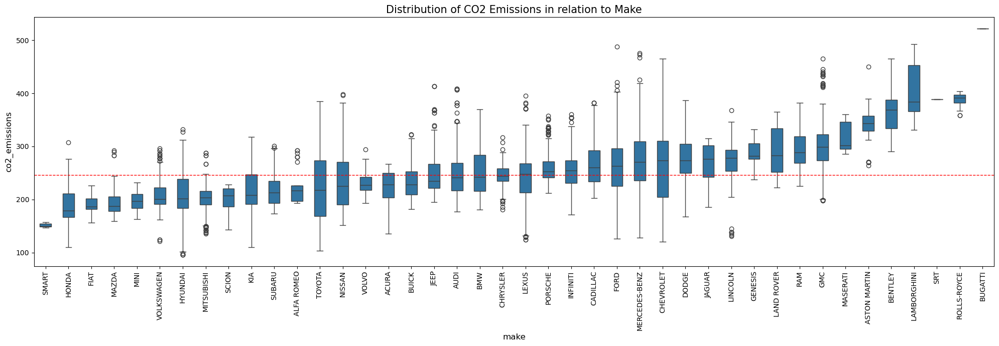

In [38]:
plt.figure(figsize=(20,7))
order = data.groupby("make")["co2_emissions"].median().sort_values(ascending=True).index
sns.boxplot(x="make", y="co2_emissions", data=data, order=order, width=0.5)
plt.title("Distribution of CO2 Emissions in relation to Make", fontsize=15)
plt.xticks(rotation=90, horizontalalignment='center')
plt.xlabel("make", fontsize=12)
plt.ylabel("co2_emissions", fontsize=12)
plt.axhline(data["co2_emissions"].median(),color='r',linestyle='dashed',linewidth=1)
plt.tight_layout()
plt.show()

### CO2 Emissions variation with Vehicle Class

In [39]:
 
df_co2_vehicle_class = data.groupby(['vehicle_class'])['co2_emissions'].mean().sort_values().reset_index()

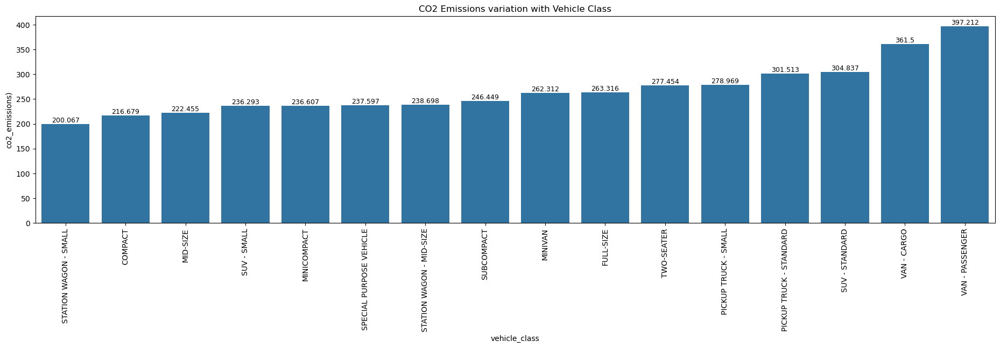

In [40]:
plt.figure(figsize=(23,5))
fig9 = sns.barplot(data = df_co2_vehicle_class, x = "vehicle_class",  y= "co2_emissions")
plt.xticks(rotation = 90)
plt.title("CO2 Emissions variation with Vehicle Class")
plt.xlabel("vehicle_class")
plt.ylabel("co2_emissions)")
plt.bar_label(fig9.containers[0], fontsize=9)
plt.show()

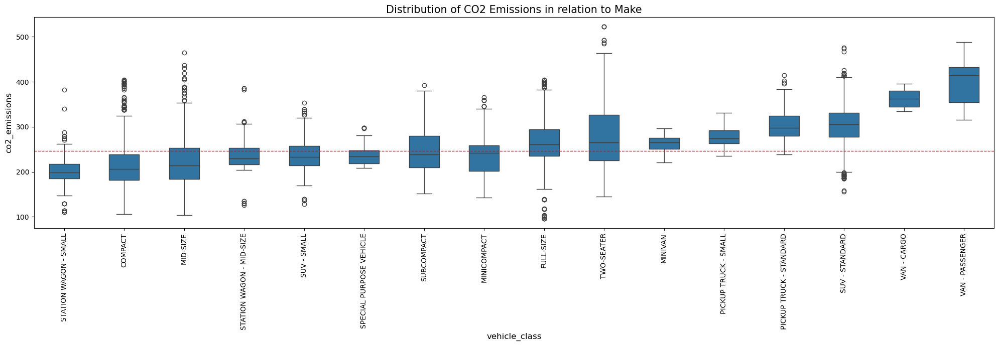

In [41]:
plt.figure(figsize=(20,7))
order = data.groupby("vehicle_class")["co2_emissions"].median().sort_values(ascending=True).index
sns.boxplot(x="vehicle_class", y="co2_emissions", data=data, order=order, width=0.5)
plt.title("Distribution of CO2 Emissions in relation to Make", fontsize=15)
plt.xticks(rotation=90, horizontalalignment='center')
plt.xlabel("vehicle_class", fontsize=12)
plt.ylabel("co2_emissions", fontsize=12)
plt.axhline(data["co2_emissions"].median(),color='r',linestyle='dashed',linewidth=1)
plt.tight_layout()
plt.show()

### CO2 Emissions variation with Transmission

In [42]:

df_co2_transmission = data.groupby(['transmission'])['co2_emissions'].mean().sort_values().reset_index()

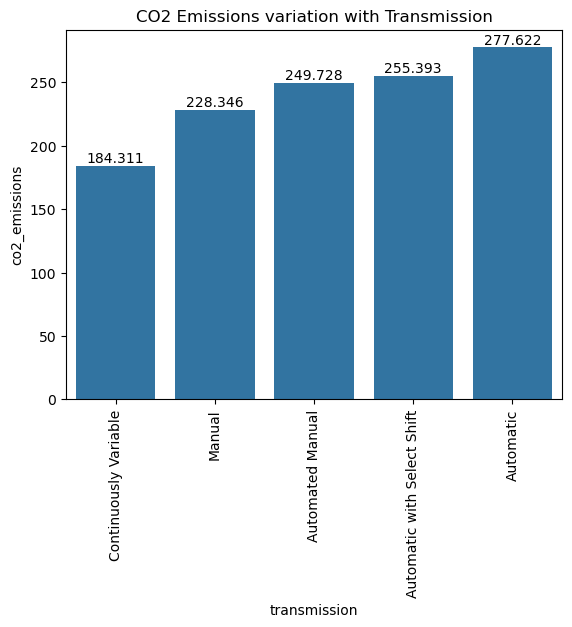

In [43]:
fig10 = sns.barplot(data = df_co2_transmission, x = "transmission",  y= "co2_emissions")
plt.xticks(rotation = 90)
plt.title("CO2 Emissions variation with Transmission")
plt.xlabel("transmission")
plt.ylabel("co2_emissions")
plt.bar_label(fig10.containers[0], fontsize=10)
plt.show()    

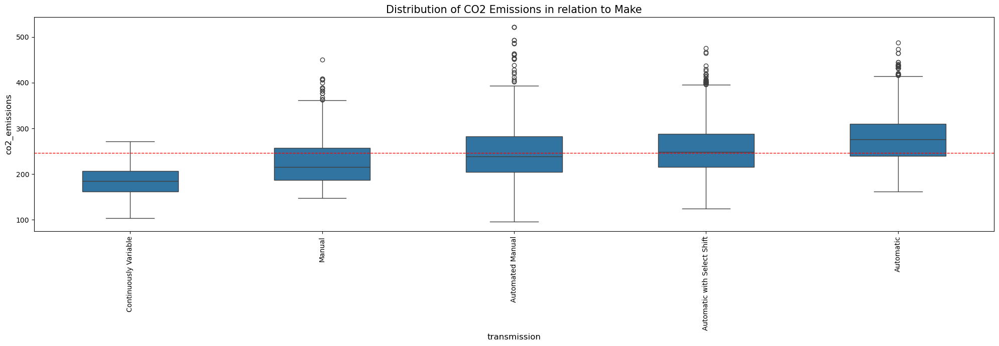

In [44]:
plt.figure(figsize=(20,7))
order = data.groupby("transmission")["co2_emissions"].median().sort_values(ascending=True).index
sns.boxplot(x="transmission", y="co2_emissions", data=data, order=order, width=0.5)
plt.title("Distribution of CO2 Emissions in relation to Make", fontsize=15)
plt.xticks(rotation=90, horizontalalignment='center')
plt.xlabel("transmission", fontsize=12)
plt.ylabel("co2_emissions", fontsize=12)
plt.axhline(data["co2_emissions"].median(),color='r',linestyle='dashed',linewidth=1)
plt.tight_layout()
plt.show()

### CO2 Emissions variation with Fuel Type

In [45]:
df_co2_fuel_type = data.groupby(['fuel_type'])['co2_emissions'].mean().sort_values().reset_index()

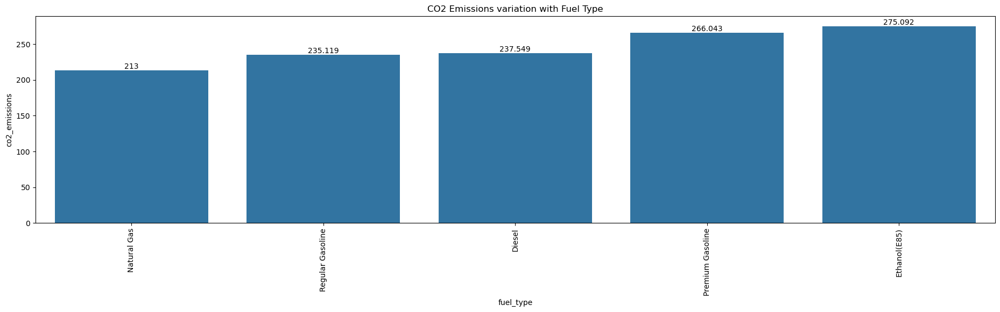

In [46]:
plt.figure(figsize=(23,5))
fig11 = sns.barplot(data = df_co2_fuel_type, x = "fuel_type",  y= "co2_emissions")
plt.xticks(rotation = 90)
plt.title("CO2 Emissions variation with Fuel Type")
plt.xlabel("fuel_type")
plt.ylabel("co2_emissions")
plt.bar_label(fig11.containers[0], fontsize=10)
plt.show()

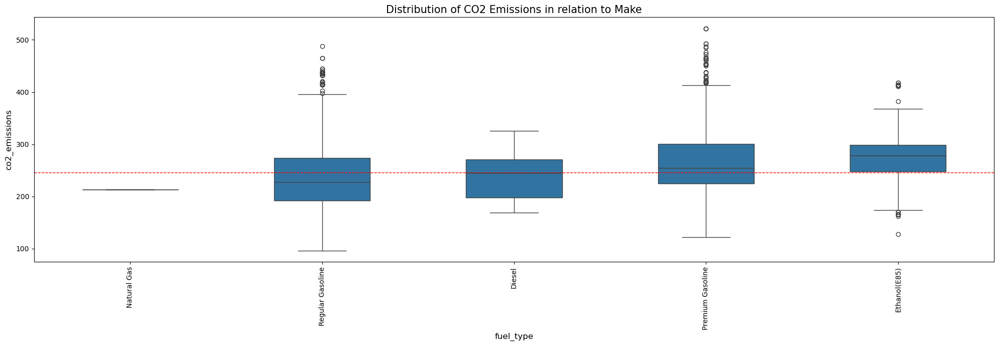

In [47]:
plt.figure(figsize=(20,7))
order = data.groupby("fuel_type")["co2_emissions"].median().sort_values(ascending=True).index
sns.boxplot(x="fuel_type", y="co2_emissions", data=data, order=order, width=0.5)
plt.title("Distribution of CO2 Emissions in relation to Make", fontsize=15)
plt.xticks(rotation=90, horizontalalignment='center')
plt.xlabel("fuel_type", fontsize=12)
plt.ylabel("co2_emissions", fontsize=12)
plt.axhline(data["co2_emissions"].median(),color='r',linestyle='dashed',linewidth=1)
plt.tight_layout()
plt.show()

### Correlation between numerical features

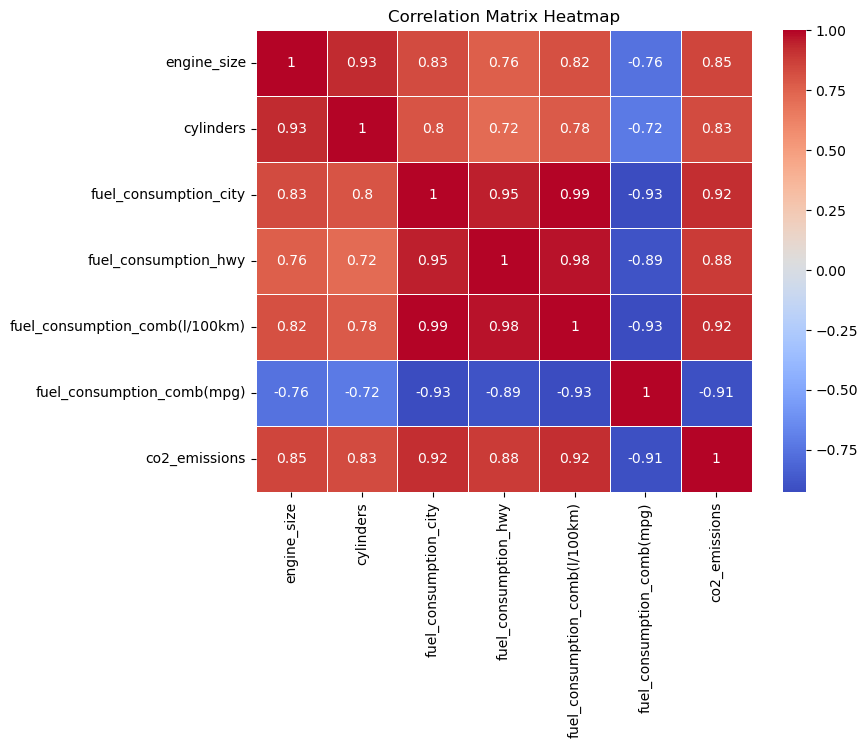

In [48]:
#Heatmap of Correlations
num_cols = data.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = data[num_cols].corr(numeric_only=True)

plt.figure(figsize=(8,6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

Observation:

1.CO₂ Emissions Correlations:
* Highly correlated with fuel consumption (city, highway, combined in L/100km)
* This makes sense because higher fuel consumption generally results in more CO₂ emissions.
* Positively correlated with engine size (0.85) and cylinders (0.83).
* Larger engines and more cylinders tend to consume more fuel and emit more CO₂.
  
2.Fuel Consumption Correlations:

* City, highway, and combined fuel consumption (L/100km) are all highly correlated (above 0.95).
* This is expected as these values are different aspects of overall fuel efficiency.
* Fuel consumption (L/100km) has a strong negative correlation with fuel consumption (mpg).
* Since miles per gallon (mpg) measures efficiency inversely (higher values mean better efficiency), this negative correlation is logical.
  
3.Engine Size & Cylinders:

* Strongly correlated with each other (0.93).
* Vehicles with larger engines generally have more cylinders.
* Positively correlated with fuel consumption(city,hwy,(l/km)).
* Larger engines tend to consume more fuel.
  
4.Negative Correlations:

* Fuel consumption (mpg) is negatively correlated with almost everything:
* Higher engine size → lower mpg (−0.76)
* More cylinders → lower mpg (−0.72)
* Higher fuel consumption (L/100km) → lower mpg (−0.93)
* Higher CO₂ emissions → lower mpg (−0.91)
* This makes sense because a vehicle that consumes more fuel (L/100km) or emits more CO₂ will typically have a lower fuel economy (mpg).

### **Scatter Plot (Numerical vs. Numerical)**

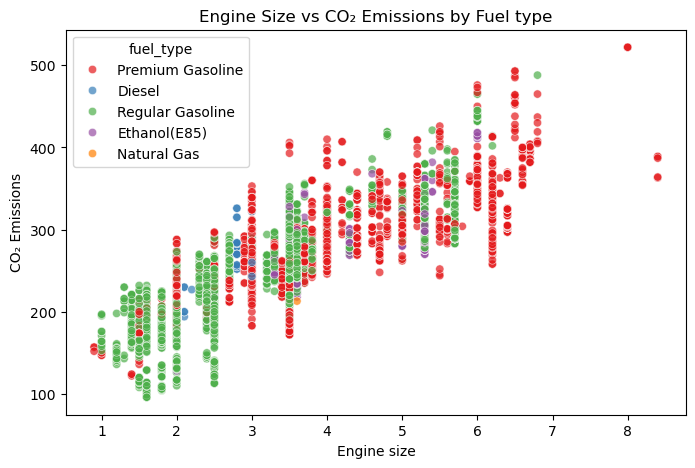

In [49]:
#colors = ["blue" if x < 250 else "red" for x in data["co2_emissions"]]

plt.figure(figsize=(8, 5))
sns.scatterplot(x=data["engine_size"], y=data["co2_emissions"],hue=data['fuel_type'], palette='Set1',alpha=0.7,edgecolor='w')

plt.xlabel("Engine size")
plt.ylabel("CO₂ Emissions")
plt.title("Engine Size vs CO₂ Emissions by Fuel type")
plt.show()

Engine Size vs CO₂ Emissions by Fuel Type

Trend: CO₂ emissions increase with engine size.

Fuel Type Impact:

* Regular Gasoline & Premium Gasoline (Green & Red): Most vehicles with larger engines emit more CO₂.
* Diesel (Blue): Generally emits less CO₂ compared to gasoline for the same engine size.
* Ethanol (Purple) & Natural Gas (Orange): Tend to have lower emissions.

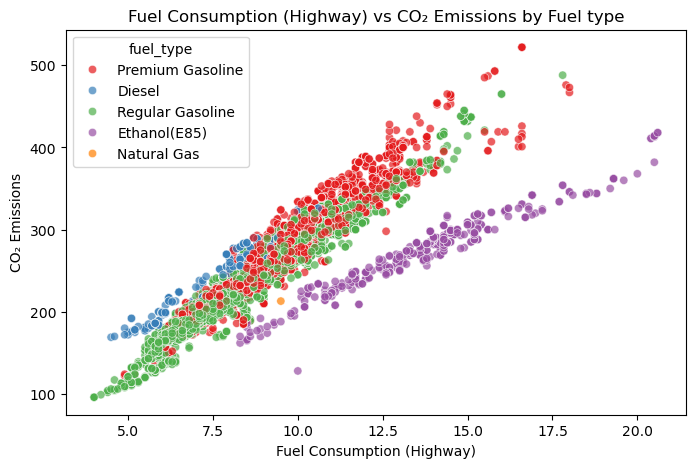

In [50]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x=data["fuel_consumption_hwy"], y=data["co2_emissions"], hue=data['fuel_type'], palette='Set1', alpha=0.7)

plt.xlabel("Fuel Consumption (Highway)")
plt.ylabel("CO₂ Emissions")
plt.title("Fuel Consumption (Highway) vs CO₂ Emissions by Fuel type")
plt.show()

Fuel Consumption (Highway) vs CO₂ Emissions by Fuel Type

Trend: Strong positive correlation between highway fuel consumption and CO₂ emissions.

Fuel Type Differences:

* Ethanol (Purple): Consistently lower emissions than gasoline for the same fuel consumption.
* Diesel (Blue): Slightly better fuel efficiency with lower emissions than gasoline.
* Premium Gasoline (Red) & Regular Gasoline (Green): Follow a clear increasing pattern.

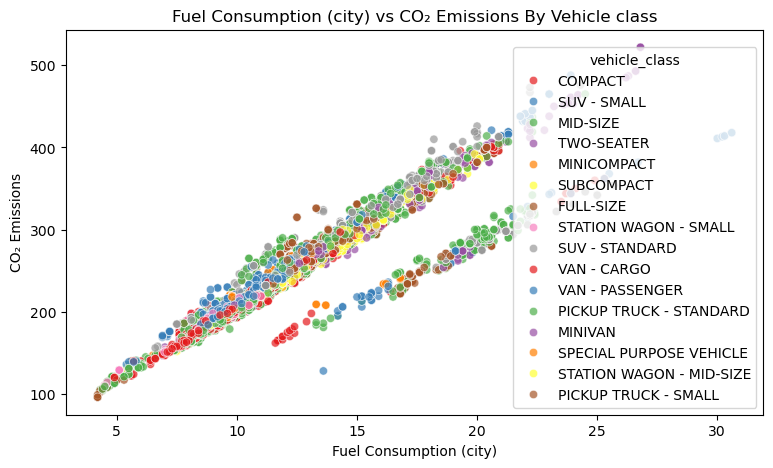

In [51]:
plt.figure(figsize=(9, 5))
sns.scatterplot(x=data["fuel_consumption_city"], y=data["co2_emissions"],hue=data['vehicle_class'], palette='Set1', alpha=0.7,edgecolor='w')

plt.xlabel("Fuel Consumption (city)")
plt.ylabel("CO₂ Emissions")
plt.title("Fuel Consumption (city) vs CO₂ Emissions By Vehicle class")
plt.show()

Fuel Consumption (City) vs CO₂ Emissions by Vehicle Class

Trend: Strong positive correlation between fuel consumption (city) and CO₂ emissions.

Vehicle Class Impact:

* Larger vehicles (SUVs, Vans, Pickup Trucks): Higher fuel consumption, higher emissions.
* Smaller vehicles (Compact, Subcompact, Mini): Lower emissions.

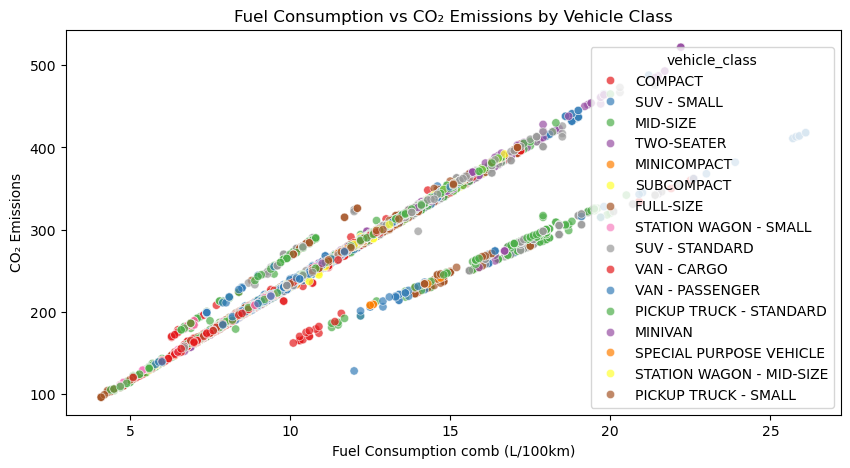

In [52]:
plt.figure(figsize=(10, 5))

sns.scatterplot( x=data["fuel_consumption_comb(l/100km)"],y=data["co2_emissions"],hue=data["vehicle_class"],  palette="Set1",alpha=0.7,edgecolor="w")

plt.xlabel("Fuel Consumption comb (L/100km)")
plt.ylabel("CO₂ Emissions")
plt.title("Fuel Consumption vs CO₂ Emissions by Vehicle Class")

plt.show()


Fuel Consumption (Combined) vs CO₂ Emissions by Vehicle Class

Trend: Strong positive correlation between fuel consumption (L/100km) and CO₂ emissions.

Distinct Grouping:

* Larger vehicles (SUVs, Pickup Trucks, Vans): Emit significantly more CO₂.
* Smaller vehicles (Compact, Subcompact): More fuel-efficient, emitting less CO₂.

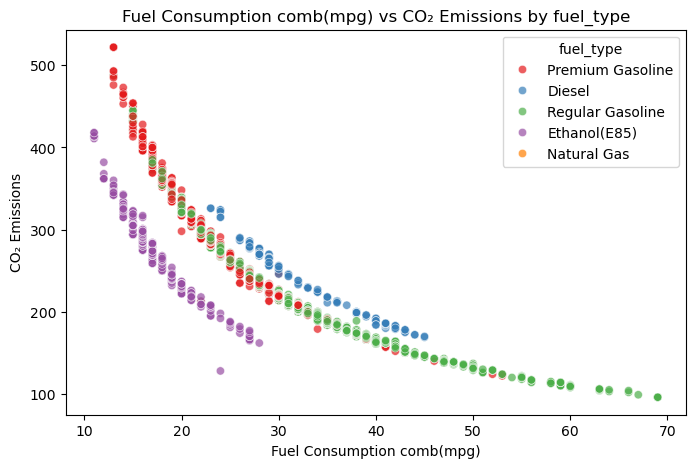

In [53]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x=data["fuel_consumption_comb(mpg)"], y=data["co2_emissions"], hue=data["fuel_type"], palette = 'Set1', alpha=0.7,edgecolor='w')

plt.xlabel("Fuel Consumption comb(mpg)")
plt.ylabel("CO₂ Emissions")
plt.title("Fuel Consumption comb(mpg) vs CO₂ Emissions by fuel_type")
plt.show()

Fuel Consumption (mpg) vs CO₂ Emissions by Fuel Type

Trend: Inverse relationship—as fuel efficiency (mpg) increases, CO₂ emissions decrease.

Fuel Type Variations:

* Ethanol (Purple): Lowest emissions for given mpg.
* Diesel (Blue): Better fuel efficiency (higher mpg) compared to gasoline.
* Gasoline (Regular & Premium - Red & Green): Higher emissions for the same mpg.

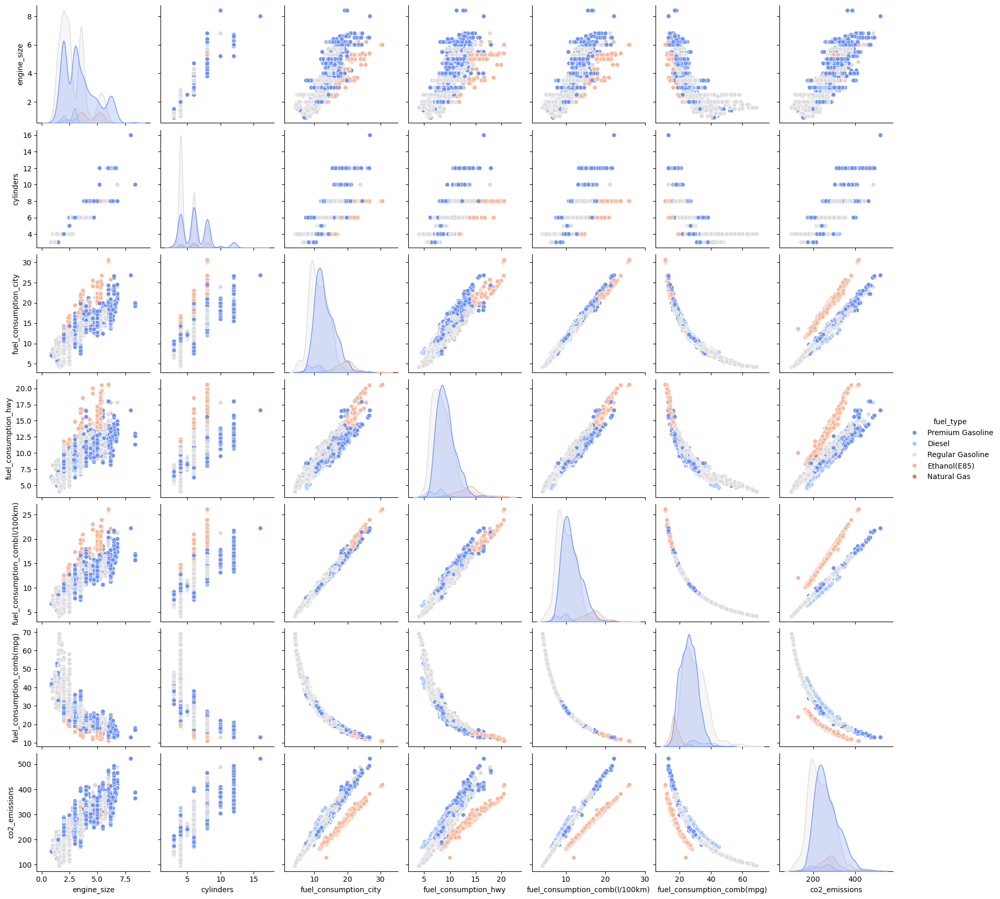

In [54]:
# Create pairplot with hue
sns.pairplot(data, hue="fuel_type", palette="coolwarm")

plt.show()

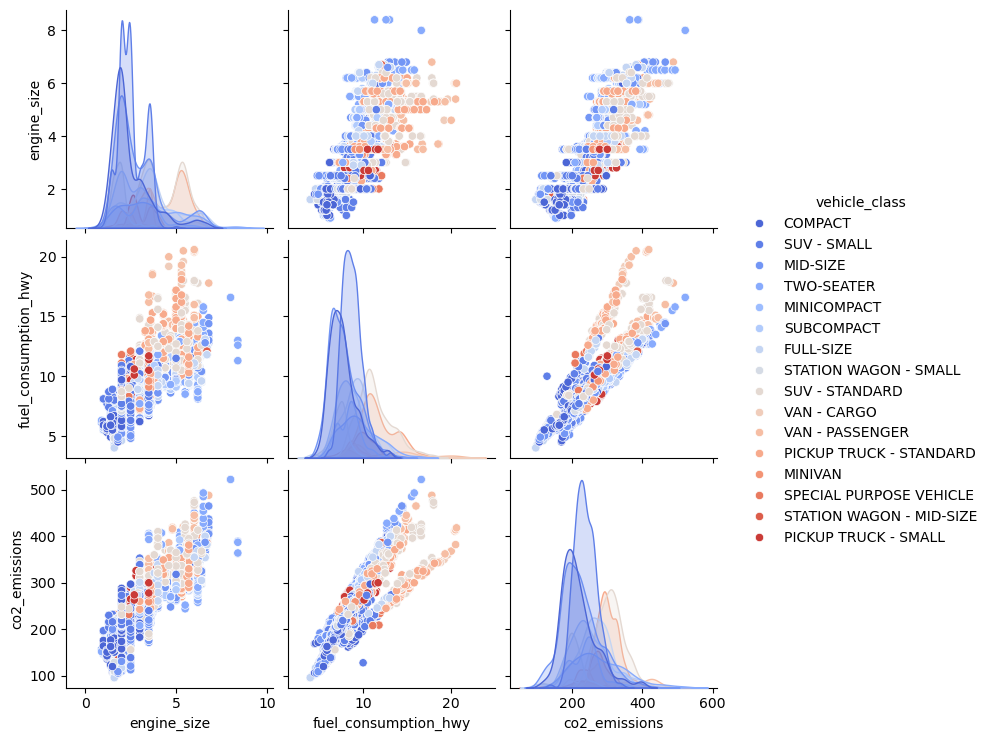

In [55]:
sns.pairplot(data, vars=["engine_size", "fuel_consumption_hwy", "co2_emissions"], hue="vehicle_class", palette="coolwarm")
plt.show()

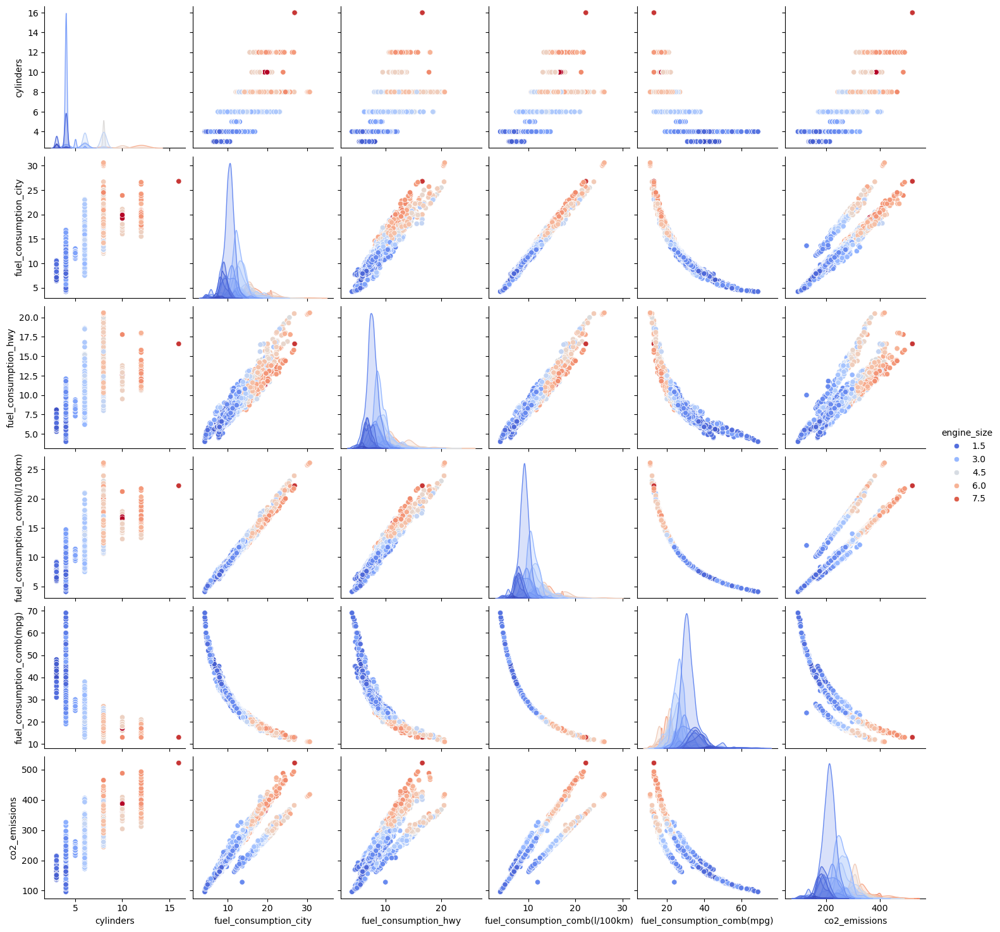

In [56]:
sns.pairplot(data, hue="engine_size", palette="coolwarm", diag_kind="kde")

plt.show()


Observations:

* CO₂ emissions correlate positively with engine size & fuel consumption (City, Highway, Combined).
* Diesel engines (Blue) generally have lower fuel consumption for the same CO₂ emissions compared to gasoline.
* Ethanol (Red) appears to have lower emissions compared to gasoline but higher fuel consumption.
* Engine size and number of cylinders are highly correlated (as expected).
* Larger vehicles (Pickup Trucks, SUVs) have bigger engines and higher CO₂ emissions.
* Fuel consumption is strongly correlated with CO₂ emissions across all vehicle classes.
* Smaller vehicles (Compact, Mid-size) show lower emissions and fuel consumption.
* Larger engine sizes (red dots) clearly consume more fuel and emit more CO₂.
* The correlation between fuel consumption and emissions is almost perfectly linear.
* Engines with fewer cylinders (blue) have better fuel efficiency.

##  Identify Outliers

<Figure size 1200x600 with 0 Axes>

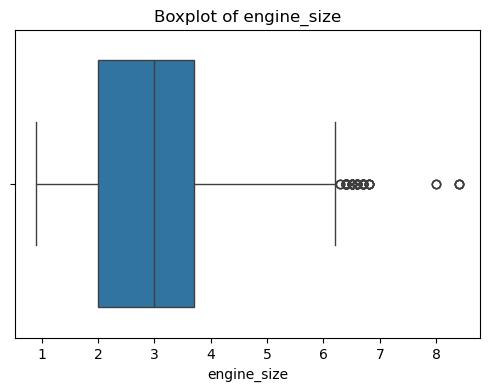

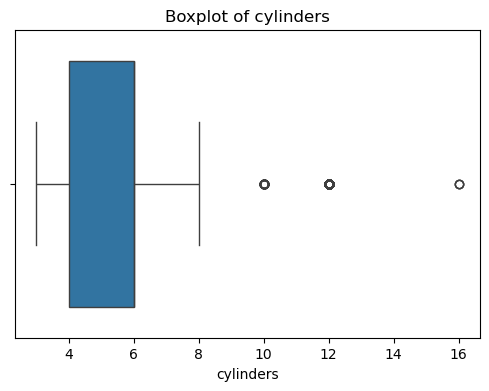

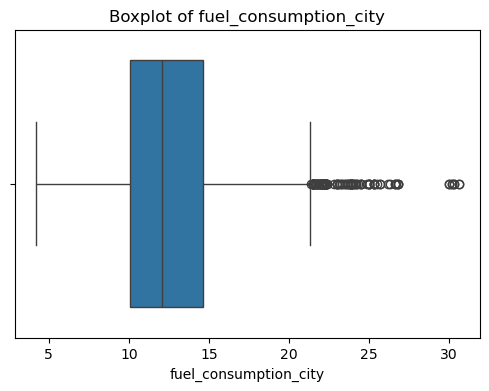

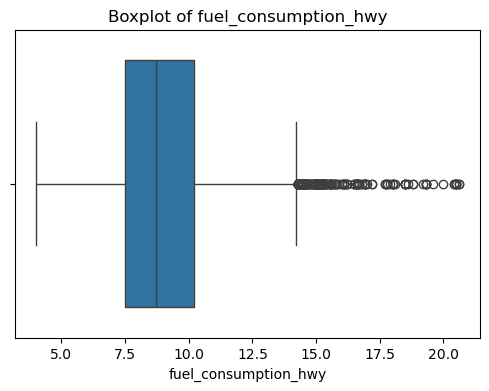

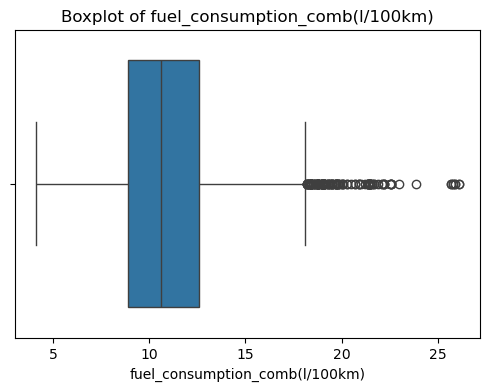

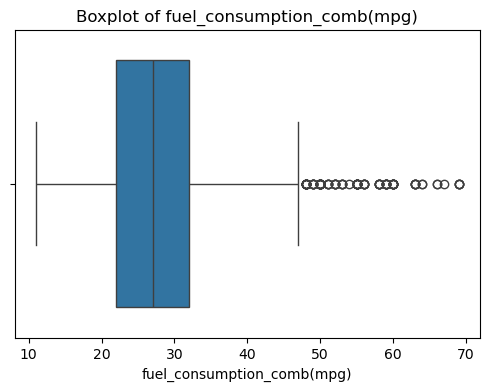

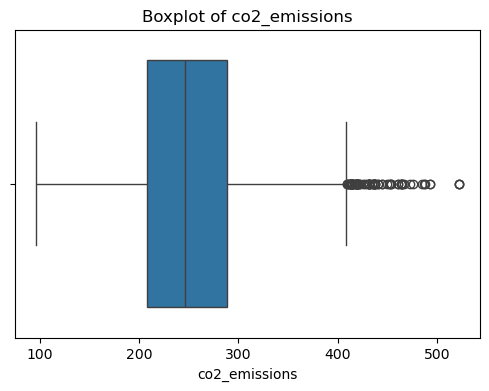

In [57]:
#check for Outliers

# List of numerical columns
num_col = data.select_dtypes(include=['float64', 'int64']).columns

# Plot boxplots for all numerical features
plt.figure(figsize=(12, 6))
for col in num_col:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=data[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

### ANOVA Test for Categorical Features

In [58]:
# Perform ANOVA test for each categorical feature
anova_results = {}
categorical_features = data.select_dtypes(include=['object']).columns

for feature in categorical_features:
    groups = [data["co2_emissions"][data[feature] == category].values for category in data[feature].unique()]
    anova_results[feature] = stats.f_oneway(*groups)

# Display the ANOVA results
for feature, result in anova_results.items():
    print(f"ANOVA result for {feature}:")
    print(f"F-statistic: {result.statistic}, p-value: {result.pvalue}")
    print()

ANOVA result for make:
F-statistic: 106.8000265413262, p-value: 0.0

ANOVA result for model:
F-statistic: 58.405091462865016, p-value: 0.0

ANOVA result for vehicle_class:
F-statistic: 266.0228094521597, p-value: 0.0

ANOVA result for transmission:
F-statistic: 404.054152691441, p-value: 2.94476513e-315

ANOVA result for fuel_type:
F-statistic: 148.94555963595639, p-value: 1.062810397301377e-122



F-statistic:
Measures the ratio of variance explained by the categorical variable to the unexplained variance.
Higher values suggest stronger effects.
    
p-value:
Determines statistical significance.  
A p-value close to 0 means the variable has a significant effect.

In [59]:
##  Encode Categorical Variables

In [60]:
# List of categorical columns
categorical_columns = ['make','model','vehicle_class', 'transmission', 'fuel_type']

# Apply Label Encoding to each categorical column
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Display the first few rows of the labeled dataframe
print(data.head())

   make  model  vehicle_class  engine_size  cylinders  transmission  \
0     0   1057              0          2.0          4             2   
1     0   1057              0          2.4          4             4   
2     0   1058              0          1.5          4             3   
3     0   1233             11          3.5          6             2   
4     0   1499             11          3.5          6             2   

   fuel_type  fuel_consumption_city  fuel_consumption_hwy  \
0          3                    9.9                   6.7   
1          3                   11.2                   7.7   
2          3                    6.0                   5.8   
3          3                   12.7                   9.1   
4          3                   12.1                   8.7   

   fuel_consumption_comb(l/100km)  fuel_consumption_comb(mpg)  co2_emissions  
0                             8.5                          33            196  
1                             9.6               

In [61]:
df_labeled=data.copy()

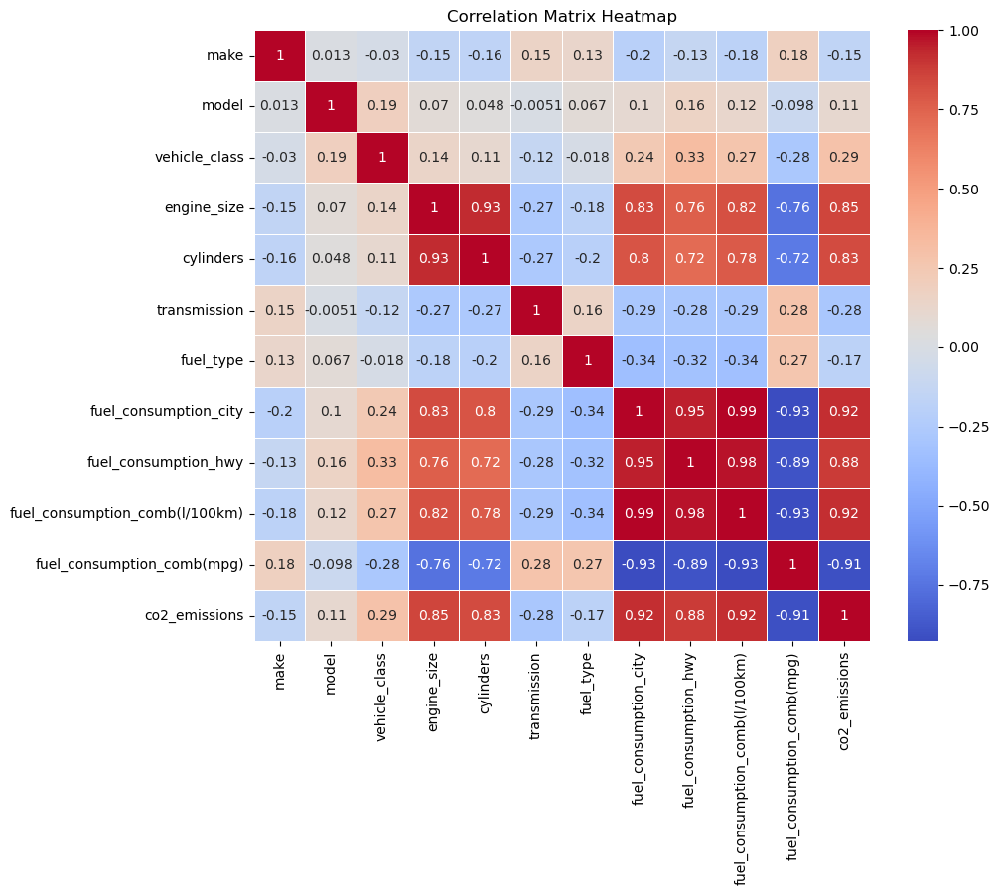

In [62]:
correlation_matrix = df_labeled.corr()

plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

# **DATA PREPROCESSING**

### **Clean and transform data for machine learning models**

##  Handle Duplicate Data

#remove duplicate rows 
#data.drop_duplicates(inplace=True)

* There are 1112 duplicates in dataset .
* We are not removing the duplicates because some rows appear identical doesn't necessarily mean they are true duplicates.
* so we are keeping the duplicates  .

In [63]:
data.shape

(7385, 12)

In [64]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
make,7385.0,19.570210,11.311625,0.0,9.0,18.0,29.0,41.0
model,7385.0,1023.658768,577.022369,0.0,531.0,999.0,1524.0,2052.0
vehicle_class,7385.0,6.364523,4.822959,0.0,2.0,6.0,11.0,15.0
engine_size,7385.0,3.160068,1.354170,0.9,2.0,3.0,3.7,8.4
cylinders,7385.0,5.615030,1.828307,3.0,4.0,6.0,6.0,16.0
transmission,7385.0,1.973324,1.148846,0.0,1.0,2.0,2.0,4.0
fuel_type,7385.0,3.321056,0.896286,0.0,3.0,3.0,4.0,4.0
fuel_consumption_city,7385.0,12.556534,3.500274,4.2,10.1,12.1,14.6,30.6
fuel_consumption_hwy,7385.0,9.041706,2.224456,4.0,7.5,8.7,10.2,20.6
fuel_consumption_comb(l/100km),7385.0,10.975071,2.892506,4.1,8.9,10.6,12.6,26.1


##  Handling Outliers

In [65]:
num_col = ['engine_size', 'cylinders', 'fuel_consumption_city', 
                      'fuel_consumption_hwy', 'fuel_consumption_comb(l/100km)', 
                      'fuel_consumption_comb(mpg)', 'co2_emissions']


# Function to detect outliers using IQR
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Apply the function to all numerical columns
for col in num_col:
    outliers = detect_outliers_iqr(data, col)
    print(f"{col} has {len(outliers)} outliers")


engine_size has 137 outliers
cylinders has 196 outliers
fuel_consumption_city has 132 outliers
fuel_consumption_hwy has 208 outliers
fuel_consumption_comb(l/100km) has 142 outliers
fuel_consumption_comb(mpg) has 114 outliers
co2_emissions has 80 outliers


In [66]:
def cap_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
    data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

# Apply capping to numerical columns
for col in num_col:
    cap_outliers(data, col)
df=data.copy()

In [67]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
make,7385.0,19.570210,11.311625,0.0,9.0,18.0,29.0,41.00
model,7385.0,1023.658768,577.022369,0.0,531.0,999.0,1524.0,2052.00
vehicle_class,7385.0,6.364523,4.822959,0.0,2.0,6.0,11.0,15.00
engine_size,7385.0,3.152844,1.335258,0.9,2.0,3.0,3.7,6.25
cylinders,7385.0,5.545159,1.629445,3.0,4.0,6.0,6.0,9.00
transmission,7385.0,1.973324,1.148846,0.0,1.0,2.0,2.0,4.00
fuel_type,7385.0,3.321056,0.896286,0.0,3.0,3.0,4.0,4.00
fuel_consumption_city,7385.0,12.518145,3.376879,4.2,10.1,12.1,14.6,21.35
fuel_consumption_hwy,7385.0,8.996994,2.081056,4.0,7.5,8.7,10.2,14.25
fuel_consumption_comb(l/100km),7385.0,10.937360,2.770957,4.1,8.9,10.6,12.6,18.15


###  Check skewness of numerical features

In [68]:

# Select only numerical columns

print(f'After removing Outliers')
num_col = ['engine_size', 'cylinders', 'fuel_consumption_city', 
                      'fuel_consumption_hwy', 'fuel_consumption_comb(l/100km)', 
                      'fuel_consumption_comb(mpg)', 'co2_emissions'
          ]

#num_col = df.select_dtypes(include=['float64', 'int64']).columns

# Calculate skewness
skewness_values = df[num_col].skew()

# Display skewness values
print("Skewness of numerical columns:\n", skewness_values)

After removing Outliers
Skewness of numerical columns:
 engine_size                       0.745292
cylinders                         0.488577
fuel_consumption_city             0.557430
fuel_consumption_hwy              0.645416
fuel_consumption_comb(l/100km)    0.598995
fuel_consumption_comb(mpg)        0.491622
co2_emissions                     0.390413
dtype: float64


Key Observations:

Skewness Reduced
* Before removing outliers, these features likely had a higher skew, especially in engine_size, fuel_consumption, and co2_emissions.
* Now, the skewness values are mostly under 1.0.
* Co2 emissions ,Cylinder , fuel Consumption comb(mpg ) are fairly symmetric , its indicating a rough normal distribution. (acceptable)
* engine size , fuel consummption (hwy,city ) , fuel consumption comb(l/km) are moderately skewness. 

After Detecing Outliers


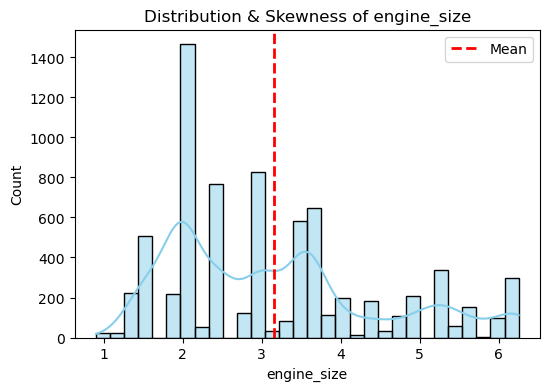

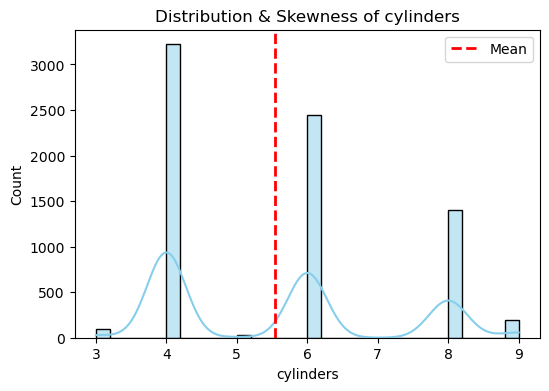

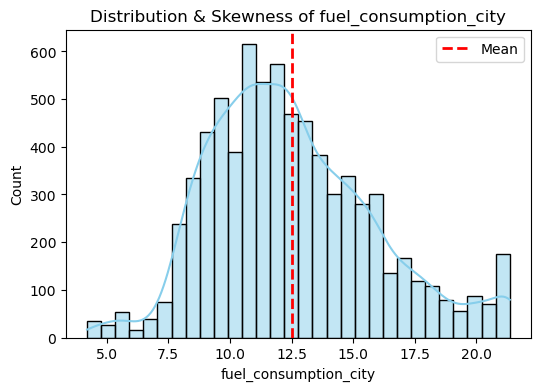

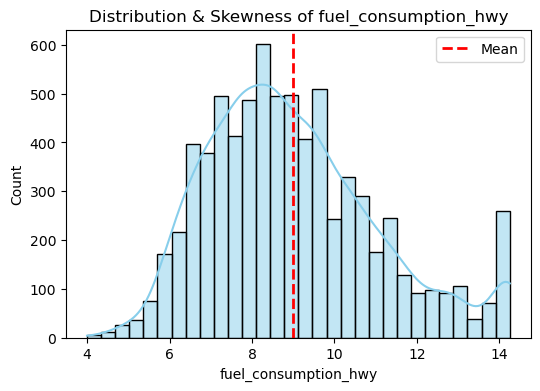

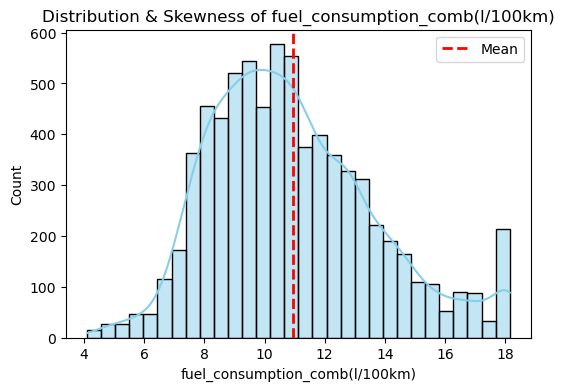

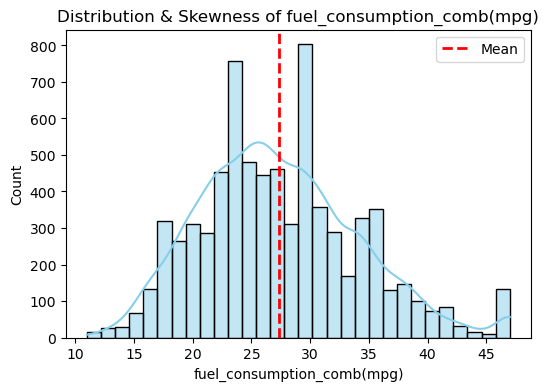

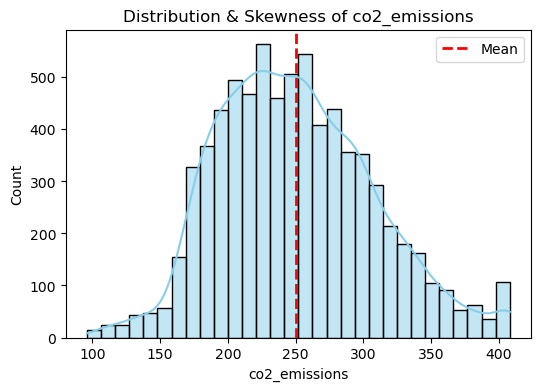

In [69]:
print(f'After Detecing Outliers')    
# Select numerical columns
num_cols = ['engine_size', 'cylinders', 'fuel_consumption_city', 
                      'fuel_consumption_hwy', 'fuel_consumption_comb(l/100km)', 
                      'fuel_consumption_comb(mpg)', 'co2_emissions']

#num_col = df.select_dtypes(include=['float64', 'int64']).columns

# Plot histograms with KDE for each numerical column
for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], bins=30, kde=True, color="skyblue")
    plt.title(f'Distribution & Skewness of {col}')
    plt.axvline(df[col].mean(), color='red', linestyle='dashed', linewidth=2, label="Mean")
    plt.legend()
    plt.show()
    


In [70]:
df.columns


Index(['make', 'model', 'vehicle_class', 'engine_size', 'cylinders',
       'transmission', 'fuel_type', 'fuel_consumption_city',
       'fuel_consumption_hwy', 'fuel_consumption_comb(l/100km)',
       'fuel_consumption_comb(mpg)', 'co2_emissions'],
      dtype='object')

In [71]:
df[num_cols].corr()

,engine_size,cylinders,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
engine_size,1.000000,0.944597,0.838872,0.780557,0.827956,-0.789750,0.852406
cylinders,0.944597,1.000000,0.820380,0.755447,0.806971,-0.776565,0.840185
fuel_consumption_city,0.838872,0.820380,1.000000,0.948900,0.993894,-0.956628,0.925447
fuel_consumption_hwy,0.780557,0.755447,0.948900,1.000000,0.977243,-0.933241,0.902474
fuel_consumption_comb(l/100km),0.827956,0.806971,0.993894,0.977243,1.000000,-0.959080,0.927862
fuel_consumption_comb(mpg),-0.789750,-0.776565,-0.956628,-0.933241,-0.959080,1.000000,-0.929102
co2_emissions,0.852406,0.840185,0.925447,0.902474,0.927862,-0.929102,1.000000


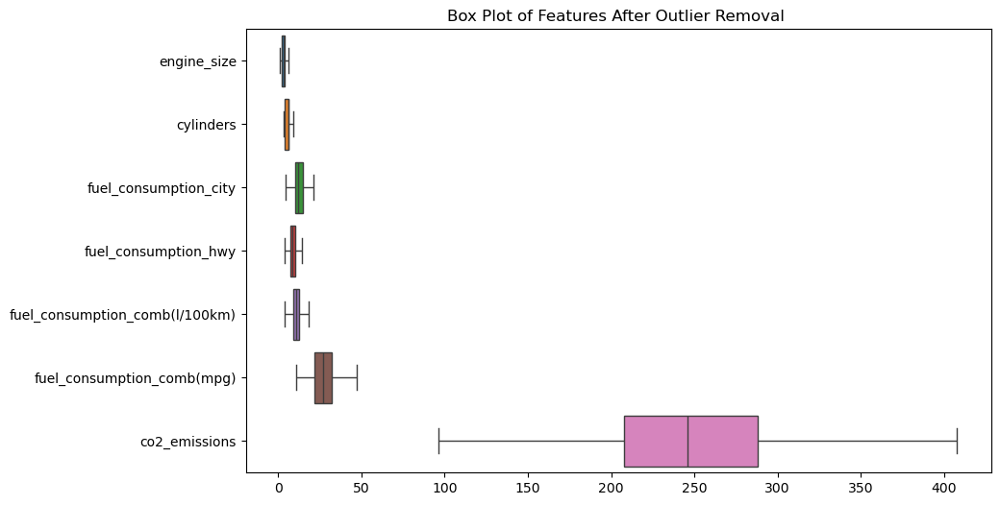

In [72]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df[num_cols], orient="h")
plt.title("Box Plot of Features After Outlier Removal ")
plt.show()



Box Plot Looks Well-Balanced

* The fuel consumption and engine size features now have tighter ranges.
* CO₂ emissions still have a wider spread, but without extreme outliers.

## Correlation Analysis

In [73]:
df.shape

(7385, 12)

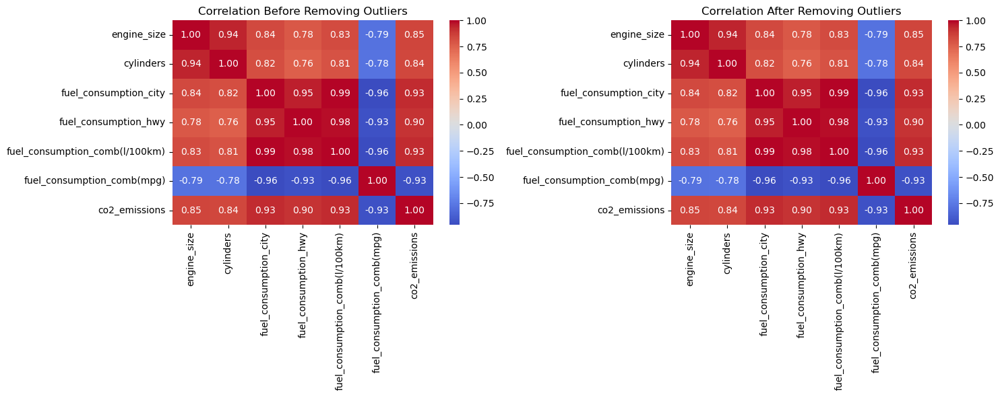

In [74]:
# Select numerical columns only
num_cols = ['engine_size', 'cylinders', 'fuel_consumption_city', 'fuel_consumption_hwy', 
            'fuel_consumption_comb(l/100km)', 'fuel_consumption_comb(mpg)', 'co2_emissions']

# Compute correlation before removing outliers
corr_before = data[num_cols].corr()

# Compute correlation after removing outliers
corr_after = df[num_cols].corr()

# ------- PLOT HEATMAPS BEFORE & AFTER REMOVING OUTLIERS -------
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Heatmap before outlier removal
sns.heatmap(corr_before, annot=True, cmap="coolwarm", fmt=".2f", ax=axes[0])
axes[0].set_title("Correlation Before Removing Outliers")

# Heatmap after outlier removal
sns.heatmap(corr_after, annot=True, cmap="coolwarm", fmt=".2f", ax=axes[1])
axes[1].set_title("Correlation After Removing Outliers")

plt.tight_layout()
plt.show()


# **Data Cleaning**

In [75]:
df_check=df['fuel_type'].value_counts()
df_check

fuel_type
4    3637
3    3202
1     370
0     175
2       1
Name: count, dtype: int64

**Impact on Model Performance: If Natural Gas vehicles have distinct CO₂ emission patterns, removing them might slightly affect the model's accuracy**

In [76]:
df_corr=df.select_dtypes(include=['float','int']).columns

In [77]:
df[df_corr].corr().T

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
make,1.000000,0.012679,-0.029558,-0.149271,-0.179947,0.154457,0.130867,-0.199362,-0.125561,-0.176317,0.184599,-0.152803
model,0.012679,1.000000,0.190713,0.070214,0.058070,-0.005056,0.066683,0.104392,0.168084,0.126657,-0.106499,0.110339
vehicle_class,-0.029558,0.190713,1.000000,0.144760,0.125376,-0.121749,-0.018493,0.233516,0.326638,0.267532,-0.281367,0.283814
engine_size,-0.149271,0.070214,0.144760,1.000000,0.944597,-0.275423,-0.177939,0.838872,0.780557,0.827956,-0.789750,0.852406
cylinders,-0.179947,0.058070,0.125376,0.944597,1.000000,-0.280380,-0.212869,0.820380,0.755447,0.806971,-0.776565,0.840185
transmission,0.154457,-0.005056,-0.121749,-0.275423,-0.280380,1.000000,0.156018,-0.285872,-0.289997,-0.290614,0.302500,-0.280536
fuel_type,0.130867,0.066683,-0.018493,-0.177939,-0.212869,0.156018,1.000000,-0.335033,-0.296470,-0.326446,0.273780,-0.177278
fuel_consumption_city,-0.199362,0.104392,0.233516,0.838872,0.820380,-0.285872,-0.335033,1.000000,0.948900,0.993894,-0.956628,0.925447
fuel_consumption_hwy,-0.125561,0.168084,0.326638,0.780557,0.755447,-0.289997,-0.296470,0.948900,1.000000,0.977243,-0.933241,0.902474
fuel_consumption_comb(l/100km),-0.176317,0.126657,0.267532,0.827956,0.806971,-0.290614,-0.326446,0.993894,0.977243,1.000000,-0.959080,0.927862


In [78]:
df.isnull().sum()

make                              0
model                             0
vehicle_class                     0
engine_size                       0
cylinders                         0
transmission                      0
fuel_type                         0
fuel_consumption_city             0
fuel_consumption_hwy              0
fuel_consumption_comb(l/100km)    0
fuel_consumption_comb(mpg)        0
co2_emissions                     0
dtype: int64

In [79]:
df.head()

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
0,0,1057,0,2.0,4.0,2,3,9.9,6.7,8.5,33.0,196.0
1,0,1057,0,2.4,4.0,4,3,11.2,7.7,9.6,29.0,221.0
2,0,1058,0,1.5,4.0,3,3,6.0,5.8,5.9,47.0,136.0
3,0,1233,11,3.5,6.0,2,3,12.7,9.1,11.1,25.0,255.0
4,0,1499,11,3.5,6.0,2,3,12.1,8.7,10.6,27.0,244.0


In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7385 entries, 0 to 7384
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   make                            7385 non-null   int32  
 1   model                           7385 non-null   int32  
 2   vehicle_class                   7385 non-null   int32  
 3   engine_size                     7385 non-null   float64
 4   cylinders                       7385 non-null   float64
 5   transmission                    7385 non-null   int32  
 6   fuel_type                       7385 non-null   int32  
 7   fuel_consumption_city           7385 non-null   float64
 8   fuel_consumption_hwy            7385 non-null   float64
 9   fuel_consumption_comb(l/100km)  7385 non-null   float64
 10  fuel_consumption_comb(mpg)      7385 non-null   float64
 11  co2_emissions                   7385 non-null   float64
dtypes: float64(7), int32(5)
memory usa

Now ,In df there are no null values and Dtype are float and integer

## 6.Feature Scaling

### **Normalization (Min-Max Scaling)**

In [81]:
# Select numerical columns
features =  ['engine_size','cylinders','fuel_consumption_city','fuel_consumption_hwy','fuel_consumption_comb(l/100km)','fuel_consumption_comb(mpg)']

#Applying Minmaxscalar
scaler = MinMaxScaler()
df[features] = scaler.fit_transform(df[features])

#check the normalized values
df[features].head()

,engine_size,cylinders,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg)
0,0.205607,0.166667,0.332362,0.263415,0.313167,0.611111
1,0.280374,0.166667,0.408163,0.360976,0.391459,0.500000
2,0.112150,0.166667,0.104956,0.175610,0.128114,1.000000
3,0.485981,0.500000,0.495627,0.497561,0.498221,0.388889
4,0.485981,0.500000,0.460641,0.458537,0.462633,0.444444


In [82]:
df.head()


,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
0,0,1057,0,0.205607,0.166667,2,3,0.332362,0.263415,0.313167,0.611111,196.0
1,0,1057,0,0.280374,0.166667,4,3,0.408163,0.360976,0.391459,0.500000,221.0
2,0,1058,0,0.112150,0.166667,3,3,0.104956,0.175610,0.128114,1.000000,136.0
3,0,1233,11,0.485981,0.500000,2,3,0.495627,0.497561,0.498221,0.388889,255.0
4,0,1499,11,0.485981,0.500000,2,3,0.460641,0.458537,0.462633,0.444444,244.0


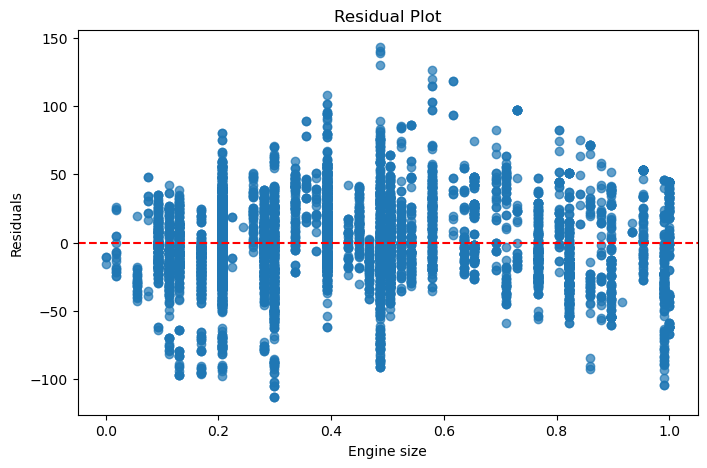

In [83]:
# Fit a simple linear regression model
X = df["engine_size"]
y = df["co2_emissions"]
X = sm.add_constant(X)  # Add intercept
model = sm.OLS(y, X).fit()
residuals = model.resid  # Get residuals

# Plot residuals
plt.figure(figsize=(8, 5))
plt.scatter(df["engine_size"], residuals, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Engine size")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()


The residual plot visualizes the difference between predicted and actual values (residuals) against engine size.

* The plot shows no clear pattern or trend in the residuals, which suggests that the linear regression model is appropriate for the data and that there is non-constant variance present. The residuals appear to be randomly scattered around zero, indicating that the model's errors are random and unbiased.
  
* The residual plot shows a random and unbiased pattern, it means our current model is fitting the data well.

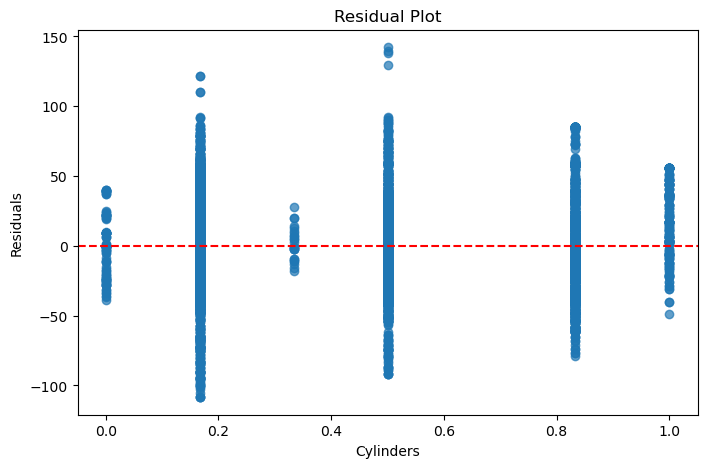

In [84]:
# Fit a simple linear regression model
X = df["cylinders"]
y = df["co2_emissions"]
X = sm.add_constant(X)  # Add intercept
model = sm.OLS(y, X).fit()
residuals = model.resid  # Get residuals

# Plot residuals
plt.figure(figsize=(8, 5))
plt.scatter(df["cylinders"], residuals, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Cylinders")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()


Ideally, residuals should be randomly scattered around the horizontal zero line, indicating that the linear regression model appropriately fits the data.

Patterns:

* The plot reveals some patterns.
* This suggests that the model's fit may be less accurate for these cylinder values.
  
Homoscedasticity:

* The assumption of homoscedasticity (constant variance of errors) seems to be violated, as the spread of residuals varies across different cylinder counts. 
* This could indicate that the model's predictions are more reliable for some cylinder values than others.


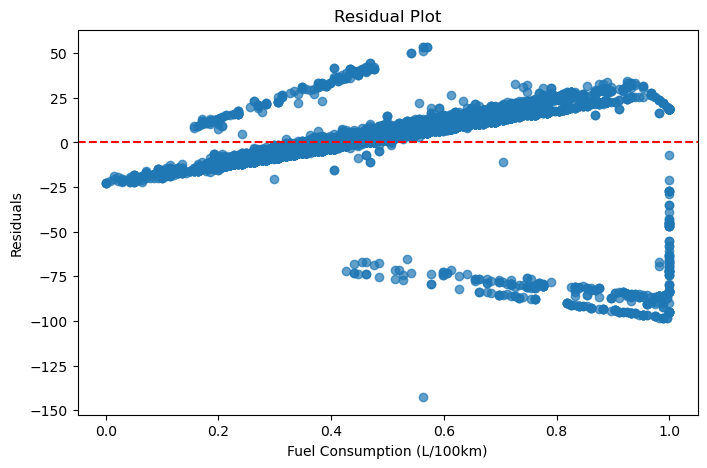

In [85]:
# Fit a simple linear regression model
X = df["fuel_consumption_comb(l/100km)"]
y = df["co2_emissions"]
X = sm.add_constant(X)  # Add intercept
model = sm.OLS(y, X).fit()
residuals = model.resid  # Get residuals

# Plot residuals
plt.figure(figsize=(8, 5))
plt.scatter(df["fuel_consumption_comb(l/100km)"], residuals, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fuel Consumption (L/100km)")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()


Random scatter:

* For fuel consumption values between 0 and 0.8 L/100km, the residuals appear to be randomly scattered around the zero line, suggesting that the linear model is a reasonable fit for this range.
  
Non-random pattern:

* For fuel consumption values between 0.8 and 1.0 L/100km, a distinct pattern emerges, indicating that the linear model does not fit the data well in this range. The residuals are mostly negative and form a curve, suggesting a non-linear relationship.
  
Heteroscedasticity:

* The spread of the residuals varies across different fuel consumption levels. This suggests heteroscedasticity, where the variance of the errors is not constant.

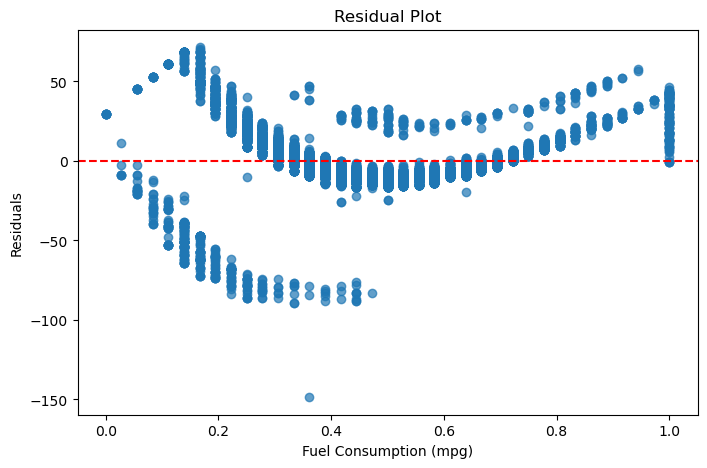

In [86]:
# Fit a simple linear regression model
X = df["fuel_consumption_comb(mpg)"]
y = df["co2_emissions"]
X = sm.add_constant(X)  # Add intercept
model = sm.OLS(y, X).fit()
residuals = model.resid  # Get residuals

# Plot residuals
plt.figure(figsize=(8, 5))
plt.scatter(df["fuel_consumption_comb(mpg)"], residuals, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fuel Consumption (mpg)")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()


* The plot shows a clear pattern, suggesting that a linear model is not appropriate for this data.
* The residuals form a U-shape, indicating a non-linear relationship between fuel consumption and the dependent variable.
* This pattern suggests that a higher-order polynomial or another non-linear model might be a better fit for the data.

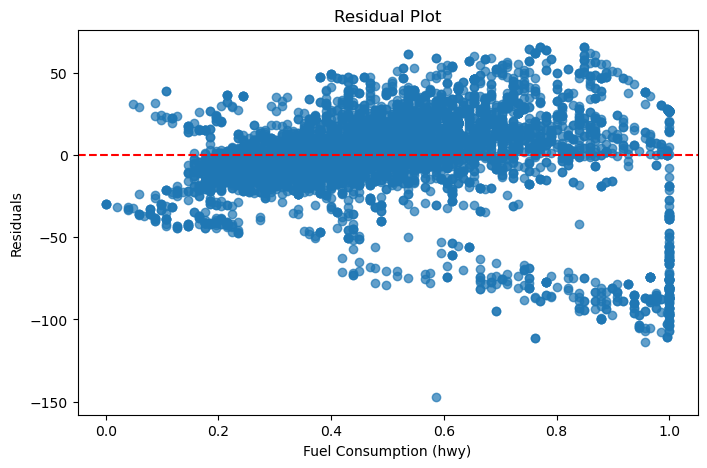

In [87]:

# Fit a simple linear regression model
X = df["fuel_consumption_hwy"]
y = df["co2_emissions"]
X = sm.add_constant(X)  # Add intercept
model = sm.OLS(y, X).fit()
residuals = model.resid  # Get residuals

# Plot residuals
plt.figure(figsize=(8, 5))
plt.scatter(df["fuel_consumption_hwy"], residuals, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fuel Consumption (hwy)")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()


Non-random pattern:

* The residuals form a curve, with most points above the zero line for lower fuel consumption values and below the line for higher values, before rising again at the extreme end.
* This pattern suggests that the model is systematically mispredicting the outcome.
* Its indicating non-linearity in the data that the model is not capturing.
* Thus, residual plot suggests that a linear model is not a good fit for the data. 

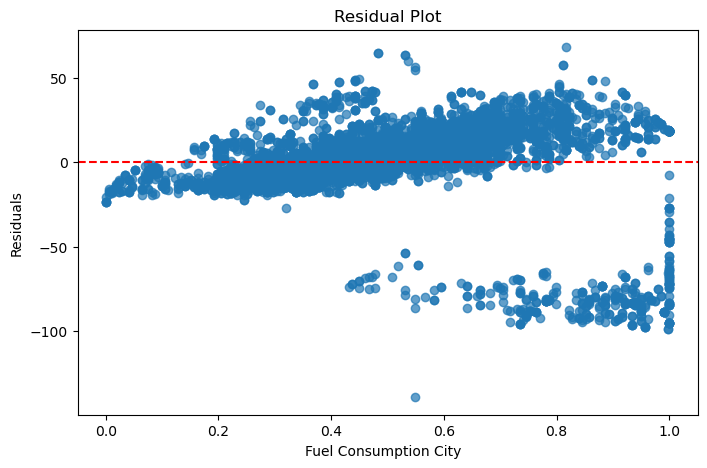

In [88]:

# Fit a simple linear regression model
X = df["fuel_consumption_city"]
y = df["co2_emissions"]
X = sm.add_constant(X)  # Add intercept
model = sm.OLS(y, X).fit()
residuals = model.resid  # Get residuals

# Plot residuals
plt.figure(figsize=(8, 5))
plt.scatter(df["fuel_consumption_city"], residuals, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fuel Consumption City  ")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()

* The residual plot suggests that the linear model might not be the best fit for the data due to the subtle curve-like pattern and potential heteroscedasticity.
* Additionally, the presence of outliers should be investigated.
* It might be beneficial to explore non-linear models or transformations of the variables to improve the model's fit.

In [89]:
from sklearn.feature_selection import f_classif, f_regression
import pandas as pd

# Select numerical features
X = df.iloc[:,[0,1,2,3,4,5,6,7,8,9,10]]  # Features
y = df['co2_emissions']  # Target variable

# Perform ANOVA F-test
f_values, p_values = f_regression(X, y)

# Store results in a DataFrame
anova_results = pd.DataFrame({'Feature': X.columns, 'F-Value': f_values, 'P-Value': p_values})
anova_results = anova_results.sort_values(by="F-Value", ascending=False)

print("ANOVA F-Test Results:")
print(anova_results)


ANOVA F-Test Results:
                           Feature       F-Value        P-Value
10      fuel_consumption_comb(mpg)  46598.686684   0.000000e+00
9   fuel_consumption_comb(l/100km)  45704.368836   0.000000e+00
7            fuel_consumption_city  44049.500139   0.000000e+00
8             fuel_consumption_hwy  32408.818984   0.000000e+00
3                      engine_size  19620.963273   0.000000e+00
4                        cylinders  17721.659820   0.000000e+00
2                    vehicle_class    646.804321  7.540023e-137
5                     transmission    630.679571  1.273620e-133
6                        fuel_type    239.558954   3.341331e-53
0                             make    176.504425   8.031084e-40
1                            model     90.994313   1.914433e-21


### Hybrid Method

In [90]:
from sklearn.feature_selection import RFE
# Step 1: Use Filter Method (ANOVA)
significant_features = anova_results[anova_results['P-Value'] < 0.05]['Feature']

# Step 2: Use Wrapper Method (RFE)
rfe = RFE(estimator=LinearRegression(), n_features_to_select=5)
X_rfe = rfe.fit_transform(X[significant_features], y)
rfe_selected_features = significant_features[rfe.support_]

# Step 3: Use Embedded Method (LASSO)
lasso = Lasso(alpha=0.1)
lasso.fit(X[rfe_selected_features], y)
lasso_selected_features = rfe_selected_features[lasso.coef_ != 0]

print("Final Selected Features:", list(lasso_selected_features))


Final Selected Features: ['fuel_consumption_comb(mpg)', 'fuel_consumption_comb(l/100km)', 'engine_size', 'cylinders']


## 7. Split Data for Training & Testing 

In [91]:
X=df[['engine_size','cylinders','fuel_consumption_comb(l/100km)','fuel_consumption_comb(mpg)']]
y=df['co2_emissions']
X.shape,y.shape

((7385, 4), (7385,))

In [92]:
X.head()

,engine_size,cylinders,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg)
0,0.205607,0.166667,0.313167,0.611111
1,0.280374,0.166667,0.391459,0.500000
2,0.112150,0.166667,0.128114,1.000000
3,0.485981,0.500000,0.498221,0.388889
4,0.485981,0.500000,0.462633,0.444444


In [93]:
y.head()

0    196.0
1    221.0
2    136.0
3    255.0
4    244.0
Name: co2_emissions, dtype: float64

In [94]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [95]:
X_train.shape,X_test.shape, y_train.shape,y_test.shape

((5908, 4), (1477, 4), (5908,), (1477,))

# **MODEL SELECTION**

## **Train the Models & Models Evaluation**

**Fit the selected model to the training data & Assess model performance using metrics**

In [96]:
# Function to compute train and test metrics
def train_val(y_train, y_train_pred, y_test, y_pred, models_name):
    scores = {
        models_name + '_train': { 
            "MAE": mean_absolute_error(y_train, y_train_pred),
            "MSE": mean_squared_error(y_train, y_train_pred),
            "R² Score": r2_score(y_train, y_train_pred),
            "RMSE": np.sqrt(mean_squared_error(y_train, y_train_pred)),
            "Mean Difference": np.mean(abs(y_train - y_train_pred))
        },
        models_name + '_test': {
            "MAE": mean_absolute_error(y_test, y_pred),
            "MSE": mean_squared_error(y_test, y_pred),
            "R² Score": r2_score(y_test, y_pred),
            "RMSE": np.sqrt(mean_squared_error(y_test, y_pred)),
            "Mean Difference": np.mean(abs(y_test - y_pred))
        }
    }
    return pd.DataFrame.from_dict(scores, orient='index')  

# Dictionary to store model scores
models_scores = {}

# Cross-validation function
def cross_val(models, X, y):
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(models, X, y, cv=kf, scoring='r2')
    return np.mean(cv_scores), np.std(cv_scores)  # Return mean and std deviation

# Train-test split 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
y_train = y_train.ravel()
y_test = y_test.ravel()

# ======= Linear Regression =======
lr = LinearRegression()
lr.fit(X_train, y_train)
y_train_pred_lr = lr.predict(X_train)
y_pred_lr = lr.predict(X_test)
models_scores["Linear Regression"] = train_val(y_train, y_train_pred_lr, y_test, y_pred_lr, "Linear")
cv_mean_lr, cv_std_lr = cross_val(lr, X_train, y_train)

# ======= Random Forest Regression =======
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_train_pred_rf = rf.predict(X_train)
y_pred_rf = rf.predict(X_test)
models_scores["Random Forest"] = train_val(y_train, y_train_pred_rf, y_test, y_pred_rf, "RandomForest")
cv_mean_rf, cv_std_rf = cross_val(rf, X_train, y_train)

# ======= Support Vector Regression (SVM) =======
svr = SVR(kernel='rbf')
svr.fit(X_train, y_train)
y_train_pred_svr = svr.predict(X_train)
y_pred_svr = svr.predict(X_test)
models_scores["Support Vector Machine"] = train_val(y_train, y_train_pred_svr, y_test, y_pred_svr, "SVR")
cv_mean_svr, cv_std_svr = cross_val(svr, X_train, y_train)

# ======= K-Nearest Neighbors (KNN) Regression =======
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train, y_train)
y_train_pred_knn = knn.predict(X_train)
y_pred_knn = knn.predict(X_test)
models_scores["K-Nearest Neighbors"] = train_val(y_train, y_train_pred_knn, y_test, y_pred_knn, "KNN")
cv_mean_knn, cv_std_knn = cross_val(knn, X_train, y_train)

# ======= Print All Scores =======
for models_name, score_df in models_scores.items():
    print(f"\n Model: {models_name}")
    print(score_df)

# ======= Print Cross-Validation Scores =======
cv_results = pd.DataFrame({
    "Model": ["Linear Regression", "Random Forest", "SVR", "KNN"],
    "CV Mean R²": [cv_mean_lr, cv_mean_rf, cv_mean_svr, cv_mean_knn],
    "CV Std Dev": [cv_std_lr, cv_std_rf, cv_std_svr, cv_std_knn]
})

print("\n Cross-Validation Results:")
print(cv_results.round(4))  # Round results for readability



 Model: Linear Regression
                    MAE         MSE  R² Score       RMSE  Mean Difference
Linear_train  10.890211  307.100040  0.906546  17.524270        10.890211
Linear_test   11.159993  327.972123  0.902329  18.110001        11.159993

 Model: Random Forest
                         MAE         MSE  R² Score       RMSE  Mean Difference
RandomForest_train  2.618633   33.460151  0.989818   5.784475         2.618633
RandomForest_test   4.072484  103.894633  0.969060  10.192872         4.072484

 Model: Support Vector Machine
                MAE         MSE  R² Score       RMSE  Mean Difference
SVR_train  7.170845  248.954291  0.924241  15.778285         7.170845
SVR_test   7.967065  288.168881  0.914183  16.975538         7.967065

 Model: K-Nearest Neighbors
                MAE        MSE  R² Score      RMSE  Mean Difference
KNN_train  3.246953  57.634049  0.982461  7.591709         3.246953
KNN_test   4.135139  90.532864  0.973039  9.514876         4.135139

 Cross-Validati

In [97]:
# Create residuals DataFrame for all models
residuals_df = pd.DataFrame({
    "Pred_Linear": y_pred_lr,
    "Pred_RandomForest": y_pred_rf,
    "Pred_SVR": y_pred_svr,
    "Pred_KNN": y_pred_knn,
    "Real_Value": y_test,
})

# Compute the difference (residuals)
residuals_df["Diff_Linear"] = residuals_df["Real_Value"] - residuals_df["Pred_Linear"]
residuals_df["Diff_RandomForest"] = residuals_df["Real_Value"] - residuals_df["Pred_RandomForest"]
residuals_df["Diff_SVR"] = residuals_df["Real_Value"] - residuals_df["Pred_SVR"]
residuals_df["Diff_KNN"] = residuals_df["Real_Value"] - residuals_df["Pred_KNN"]

In [98]:
residuals_df.head(10)

,Pred_Linear,Pred_RandomForest,Pred_SVR,Pred_KNN,Real_Value,Diff_Linear,Diff_RandomForest,Diff_SVR,Diff_KNN
0,256.869987,253.236459,255.091945,253.8,253.0,-3.869987,-0.236459,-2.091945,-0.8
1,321.706952,341.383941,334.927081,339.0,344.0,22.293048,2.616059,9.072919,5.0
2,327.003631,326.628933,328.016272,327.8,322.0,-5.003631,-4.628933,-6.016272,-5.8
3,306.579072,295.570770,298.729546,294.4,297.0,-9.579072,1.429230,-1.729546,2.6
4,295.022360,308.031429,301.984983,308.6,308.0,12.977640,-0.031429,6.015017,-0.6
5,330.591980,286.679333,293.275336,331.8,406.0,75.408020,119.320667,112.724664,74.2
6,250.461980,247.541354,243.680686,243.4,242.0,-8.461980,-5.541354,-1.680686,-1.4
7,217.126570,216.677763,218.320712,215.4,216.0,-1.126570,-0.677763,-2.320712,0.6
8,237.829616,247.144624,244.684640,247.0,246.0,8.170384,-1.144624,1.315360,-1.0
9,226.590746,226.519457,227.750084,227.6,223.0,-3.590746,-3.519457,-4.750084,-4.6


In [99]:
import plotly.graph_objects as go

# Define the colors for the table rows
colors = ['lightpink', 'lightgreen', 'yellow', 'lightgreen', 'yellow']

# Create the table using Plotly
fig = go.Figure(data=[go.Table(
    header=dict(
        values=[
            'Actual Values (Real Data)',
            'Linear Model Predicted',
            'KNN Model Predicted',
            'SVR Model Predicted',
            'Random Forest Predicted'
        ],
        line_color='black', 
        fill_color='LightSlateGray',
        align='center',
        font=dict(color='white', size=15)
    ),
    cells=dict(
        values=[
            residuals_df['Real_Value'],
            residuals_df['Pred_Linear'],
            residuals_df['Pred_KNN'],
            residuals_df['Pred_SVR'],
            residuals_df['Pred_RandomForest']
        ],
        line_color=['black'],  # Border color
        fill_color=[colors * (len(residuals_df) // len(colors) + 1)],  # Repeat colors properly
        align='center',
        font=dict(color='#660033', size=10)
    )
)])

# Show the table
fig.show()


# **Visualization of Model Performance**

**We can use various plots to visualize the model performance**

##  Residual Plot (Errors for Each Model)

*****Residuals = Actual - Predicted. A good model has randomly scattered residuals around zero*****.

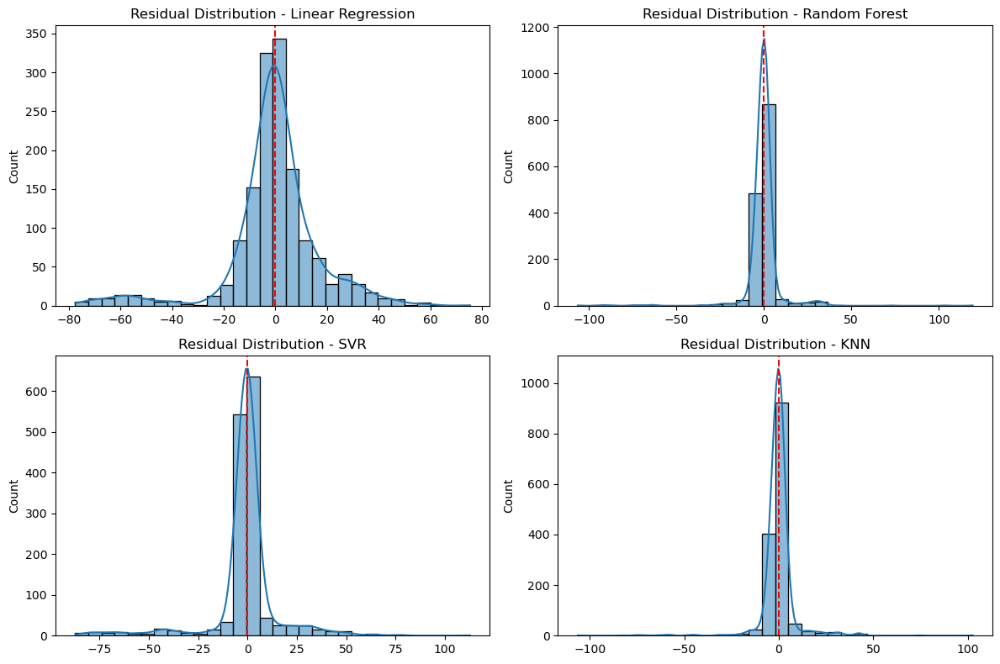

In [100]:
m1 = {
    "Linear Regression": y_pred_lr,
    "Random Forest": y_pred_rf,
    "SVR": y_pred_svr,
    "KNN": y_pred_knn
}

plt.figure(figsize=(12, 8))
for i, (model_name, y_pred) in enumerate(m1.items(), 1):
    plt.subplot(2, 2, i)
    residuals = y_test - y_pred
    sns.histplot(residuals, kde=True, bins=30)
    plt.axvline(x=0, color='red', linestyle='dashed', linewidth=1.5)
    plt.title(f"Residual Distribution - {model_name}")

plt.tight_layout()
plt.show()


* Based on the residual plots
 
* Random Forest, SVR, and KNN seem to perform better than Linear Regression, as their residuals are more tightly distributed around zero, indicating more accurate predictions.

* Linear Regression's wider spread of residuals suggests it might be less accurate .

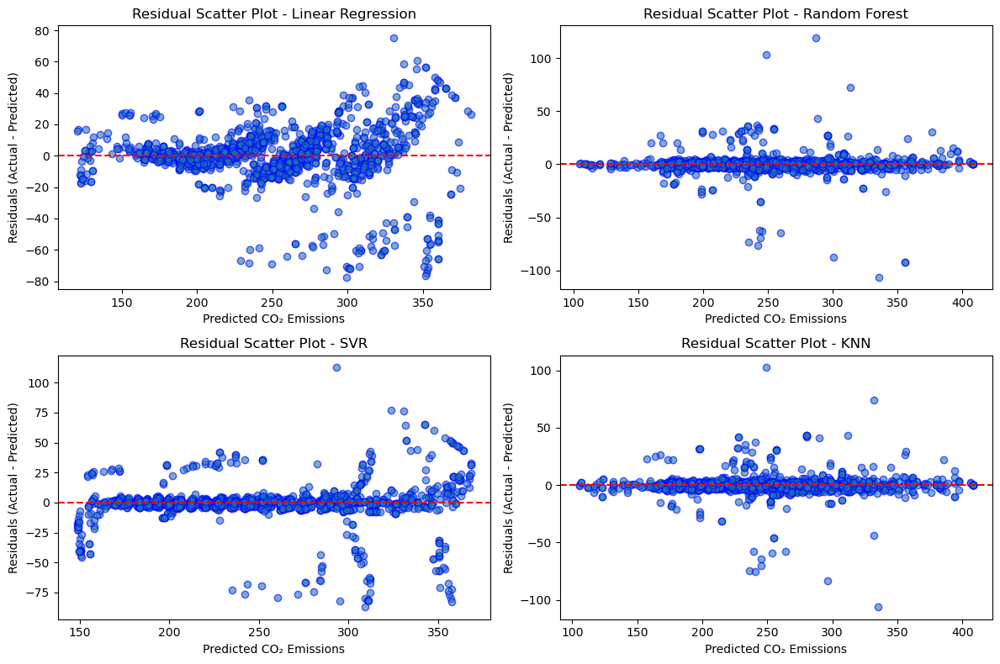

In [101]:
m2 = {
    "Linear Regression": y_pred_lr,
    "Random Forest": y_pred_rf,
    "SVR": y_pred_svr,
    "KNN": y_pred_knn
}

plt.figure(figsize=(12, 8))
for i, (model_name, y_pred) in enumerate(m2.items(), 1):
    plt.subplot(2, 2, i)
    residuals = y_test - y_pred  # Calculate residuals (actual - predicted)
    plt.scatter(y_pred, residuals, alpha=0.6, edgecolors='b')
    plt.axhline(y=0, color='red', linestyle='dashed', linewidth=1.5)  # Horizontal line at zero
    plt.xlabel("Predicted CO₂ Emissions")
    plt.ylabel("Residuals (Actual - Predicted)")
    plt.title(f"Residual Scatter Plot - {model_name}")

plt.tight_layout()
plt.show()


 * Random Forest, SVR, and KNN models appear to perform better than the Linear Regression model, as they exhibit a more random distribution of residuals.
   
*  The Linear Regression model shows signs of heteroscedasticity, which indicates that its predictions are less reliable across the range of predicted CO₂ emissions.

 ##  Actual vs. Predicted Plot (Scatter Plot for Each Model)

*****This plot helps compare actual and predicted values. Ideally, points should align along the diagonal line (y = x)*****

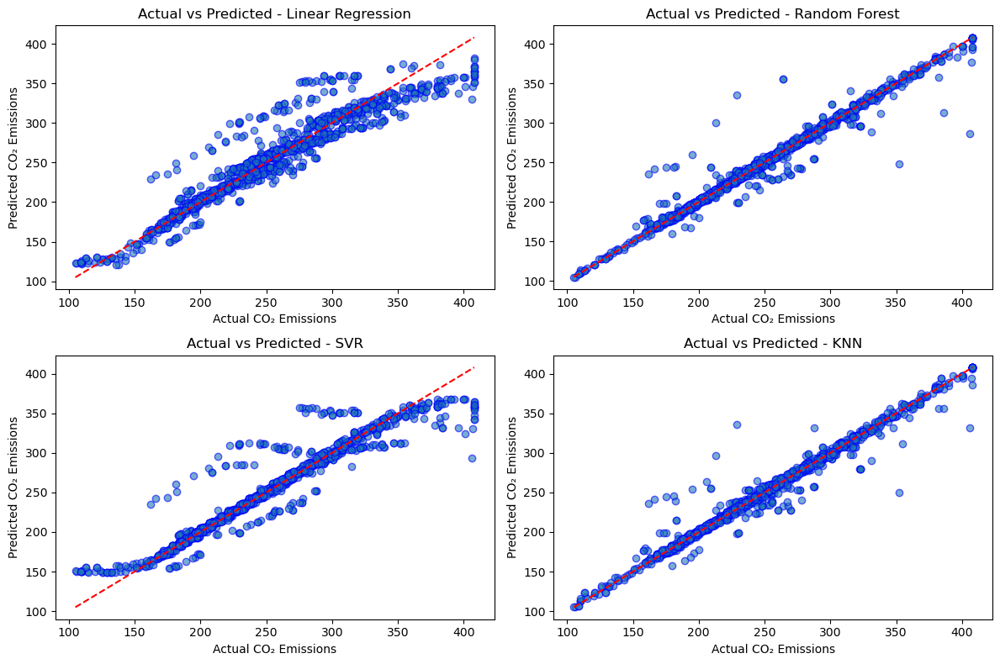

In [102]:
plt.figure(figsize=(12, 8))
for i, (model_name, y_pred) in enumerate(m1.items(), 1):
    plt.subplot(2, 2, i)
    plt.scatter(y_test, y_pred, alpha=0.6, edgecolors='b')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='dashed')
    plt.xlabel("Actual CO₂ Emissions")
    plt.ylabel("Predicted CO₂ Emissions")
    plt.title(f"Actual vs Predicted - {model_name}")

plt.tight_layout()
plt.show()



 * The KNN model appears to be the best fit for predicting CO₂ emissions in this comparison, followed by Random Forest, while Linear Regression and SVR show relatively lower accuracy.
 * These visualizations help assess the performance of different regression models in predicting CO₂ emissions, with KNN demonstrating the strongest predictive capability in this case. 

##  Error Distribution for Each Model

*****Understanding how errors are distributed helps identify bias*****.

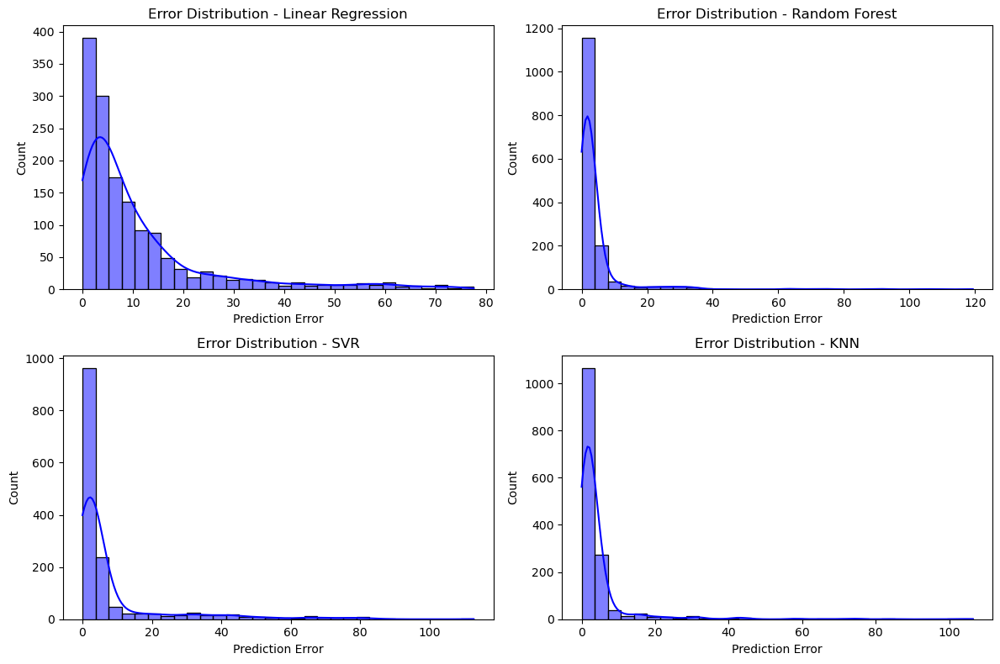

In [103]:
plt.figure(figsize=(12, 8))
for i, (model_name, y_pred) in enumerate(m2.items(), 1):
    plt.subplot(2, 2, i)
    errors = abs(y_test - y_pred)
    sns.histplot(errors, kde=True, bins=30, color="blue")
    plt.xlabel("Prediction Error")
    plt.title(f"Error Distribution - {model_name}")

plt.tight_layout()
plt.show()


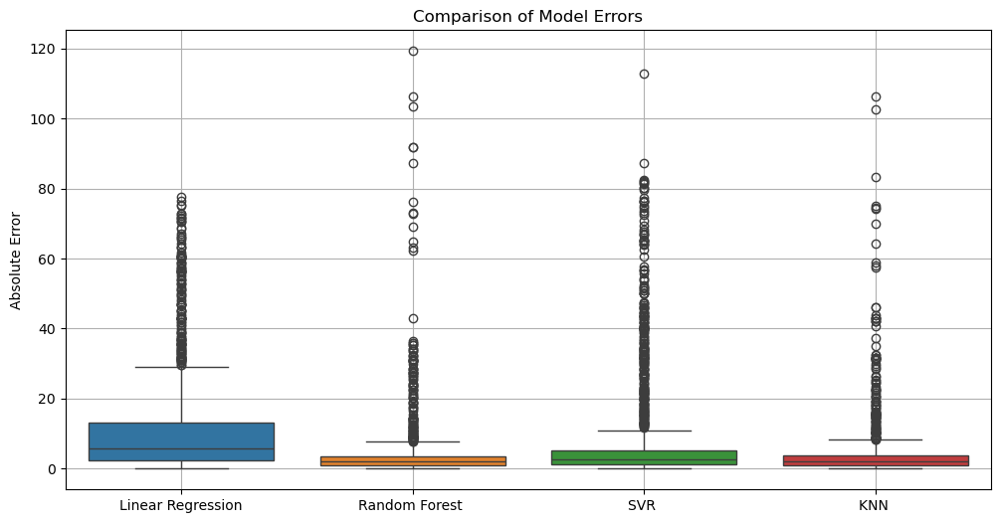

In [104]:
errors_data = pd.DataFrame({
    "Linear Regression": abs(y_test - y_pred_lr),
    "Random Forest ": abs(y_test - y_pred_rf),
    "SVR ": abs(y_test - y_pred_svr),
    "KNN ": abs(y_test - y_pred_knn),


})

plt.figure(figsize=(12, 6))
sns.boxplot(data=errors_data)
plt.ylabel("Absolute Error")
plt.title("Comparison of Model Errors")
plt.grid()
plt.show()


# **Hyperparameter Tuning (Optimization)**

**To Improve model performance , we can use GridSearchCV or RandomizedSearchCV to find the Besy Hyperparameters.**

 ### **Random Forest Regressor**

In [105]:
rf_params = {
    'n_estimators': [50, 100, 200, 500],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_random = RandomizedSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=rf_params,
    n_iter=20,  # Number of combinations to try
    cv=5,
    scoring='r2',
    verbose=1,
    random_state=42,
    n_jobs=-1
)

rf_random.fit(X_train, y_train)
best_rf = rf_random.best_estimator_
print("Best Random Forest Params:", rf_random.best_params_)


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Random Forest Params: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 20}


### **Support Vector Regressor (SVR)**

In [106]:
svr_params = {
    'kernel': ['rbf', 'linear', 'poly'],
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto', 0.01, 0.1, 1]
}

svr_random = RandomizedSearchCV(
    estimator=SVR(),
    param_distributions=svr_params,
    n_iter=15,
    cv=5,
    scoring='r2',
    verbose=1,
    random_state=42,
    n_jobs=-1
)

svr_random.fit(X_train, y_train)
best_svr = svr_random.best_estimator_
print("Best SVR Params:", svr_random.best_params_)


Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best SVR Params: {'kernel': 'rbf', 'gamma': 'scale', 'C': 100}


### **K-Nearest Neighbors (KNN)**

In [107]:
knn_params = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

knn_random = RandomizedSearchCV(
    estimator=KNeighborsRegressor(),
    param_distributions=knn_params,
    n_iter=10,
    cv=5,
    scoring='r2',
    verbose=1,
    random_state=42,
    n_jobs=-1
)

knn_random.fit(X_train, y_train)
best_knn = knn_random.best_estimator_
print("Best KNN Params:", knn_random.best_params_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best KNN Params: {'weights': 'distance', 'n_neighbors': 9, 'metric': 'minkowski'}


# **Implementing the Best Hyperparameters in Models**

**Now that we have tuned our models using RandomizedSearchCV, we can update the models with the best hyperparameters found.**

### **Update Random Forest Regressor**

In [108]:
# Best hyperparameters from RandomizedSearchCV
rf_best_params = rf_random.best_params_

rf_tuned = RandomForestRegressor(
    n_estimators=rf_best_params['n_estimators'],
    max_depth=rf_best_params['max_depth'],
    min_samples_split=rf_best_params['min_samples_split'],
    min_samples_leaf=rf_best_params['min_samples_leaf'],
    random_state=42
)

rf_tuned.fit(X_train, y_train)
y_train_pred_rf_tune = rf_tuned.predict(X_train)
y_pred_rf_tune = rf_tuned.predict(X_test)

# Store scores
models_scores["Random Forest (Tuned)"] = train_val(y_train, y_train_pred_rf_tune, y_test, y_pred_rf_tune, "RandomForest_Tuned")
cv_mean_rf_, cv_std_rf_ = cross_val(rf_tuned, X_train, y_train)


### **Update Support Vector Regressor (SVR)**

In [109]:
# Best hyperparameters from RandomizedSearchCV
svr_best_params = svr_random.best_params_

svr_tuned = SVR(
    kernel=svr_best_params['kernel'],
    C=svr_best_params['C'],
    gamma=svr_best_params['gamma']
)

svr_tuned.fit(X_train, y_train)
y_train_pred_svr_tune = svr_tuned.predict(X_train)
y_pred_svr_tune = svr_tuned.predict(X_test)

# Store scores
models_scores["Support Vector Machine (Tuned)"] = train_val(y_train, y_train_pred_svr_tune, y_test, y_pred_svr_tune, "SVR_Tuned")
cv_mean_svr_, cv_std_svr_ = cross_val(svr_tuned, X_train, y_train)


### **Update K-Nearest Neighbors (KNN)**

In [110]:
# Best hyperparameters from RandomizedSearchCV
knn_best_params = knn_random.best_params_

knn_tuned = KNeighborsRegressor(
    n_neighbors=knn_best_params['n_neighbors'],
    weights=knn_best_params['weights'],
    metric=knn_best_params['metric']
)

knn_tuned.fit(X_train, y_train)
y_train_pred_knn_tune = knn_tuned.predict(X_train)
y_pred_knn_tune = knn_tuned.predict(X_test)

# Store scores
models_scores["K-Nearest Neighbors (Tuned)"] = train_val(y_train, y_train_pred_knn_tune, y_test, y_pred_knn_tune, "KNN_Tuned")
cv_mean_knn_, cv_std_knn_ = cross_val(knn_tuned, X_train, y_train)


### **Print Updated Results**

In [111]:
# Print scores for tuned models
for models_names, score_df in models_scores.items():
    print(f"\n Model: {models_names}")
    print(score_df)

# Print cross-validation scores for tuned models
cv_results = pd.DataFrame({
    "Model": ["Random Forest (Tuned)", "SVR (Tuned)", "KNN (Tuned)"],
    "CV Mean R²": [cv_mean_rf_, cv_mean_svr_, cv_mean_knn_],
    "CV Std Dev": [cv_std_rf_, cv_std_svr_, cv_std_knn_]
})

print("\n Cross-Validation Results (Tuned Models):")
print(cv_results.round(4))



 Model: Linear Regression
                    MAE         MSE  R² Score       RMSE  Mean Difference
Linear_train  10.890211  307.100040  0.906546  17.524270        10.890211
Linear_test   11.159993  327.972123  0.902329  18.110001        11.159993

 Model: Random Forest
                         MAE         MSE  R² Score       RMSE  Mean Difference
RandomForest_train  2.618633   33.460151  0.989818   5.784475         2.618633
RandomForest_test   4.072484  103.894633  0.969060  10.192872         4.072484

 Model: Support Vector Machine
                MAE         MSE  R² Score       RMSE  Mean Difference
SVR_train  7.170845  248.954291  0.924241  15.778285         7.170845
SVR_test   7.967065  288.168881  0.914183  16.975538         7.967065

 Model: K-Nearest Neighbors
                MAE        MSE  R² Score      RMSE  Mean Difference
KNN_train  3.246953  57.634049  0.982461  7.591709         3.246953
KNN_test   4.135139  90.532864  0.973039  9.514876         4.135139

 Model: Random 

### **Train Polynomial Regression with Different Degrees**

In [112]:
# Function to evaluate polynomial regression for different degrees
def evaluate_polynomial_regression(degree):
    poly_model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    poly_model.fit(X_train, y_train)
    
    y_train_pred = poly_model.predict(X_train)
    y_test_pred = poly_model.predict(X_test)

    # Store scores
    model_name = f"Polynomial (Degree {degree})"
    models_scores[model_name] = train_val(y_train, y_train_pred, y_test, y_test_pred, model_name)

    # Cross-validation
    cv_mean = np.mean(cross_val_score(poly_model, X_train, y_train, cv=5, scoring='r2'))
    cv_std = np.std(cross_val_score(poly_model, X_train, y_train, cv=5, scoring='r2'))
    
    return cv_mean, cv_std, poly_model


### **Test Different Polynomial Degrees**

In [113]:
cv_results_poly = []
best_poly_model = None
best_r2 = float('-inf')

for degree in range(1, 5):  # Test degrees from 1 to 4
    cv_mean, cv_std, poly_model = evaluate_polynomial_regression(degree)
    
    # Store results
    cv_results_poly.append({"Degree": degree, "CV Mean R²": cv_mean, "CV Std Dev": cv_std})

    # Track the best polynomial model
    if cv_mean > best_r2:
        best_r2 = cv_mean
        best_poly_model = poly_model


### **Display Results**

In [114]:
cv_results_poly_df = pd.DataFrame(cv_results_poly)
print("\n Polynomial Regression Cross-Validation Results:")
print(cv_results_poly_df.round(4))

# Best degree based on cross-validation
best_degree = cv_results_poly_df.loc[cv_results_poly_df["CV Mean R²"].idxmax(), "Degree"]
print(f"\n🔹 Best Polynomial Degree: {best_degree}")



 Polynomial Regression Cross-Validation Results:
   Degree  CV Mean R²  CV Std Dev
0       1      0.9061      0.0073
1       2      0.9383      0.0068
2       3      0.9460      0.0053
3       4      0.9556      0.0052

🔹 Best Polynomial Degree: 4


## **Implementing the Best Polynomial Regression Model (Degree = 4) in the Tuned Model Workflow**

**Now that we have determined that Polynomial Regression with Degree 4 gives the best performance, we will integrate it into the tuned model pipeline and compare it with Random Forest, KNN, and SVR.**

### **Train the Best Polynomial Regression Model**

In [115]:
# Create and train the best polynomial model
best_poly_model = make_pipeline(PolynomialFeatures(degree=4), LinearRegression())
best_poly_model.fit(X_train, y_train)

# Predict on train and test data
y_train_pred_poly = best_poly_model.predict(X_train)
y_pred_poly = best_poly_model.predict(X_test)

# Store model evaluation scores
models_scores["Polynomial Regression (Tuned)"] = train_val(y_train, y_train_pred_poly, y_test, y_pred_poly, "Polynomial_Tuned")

# Cross-validation scores for Polynomial Regression
cv_mean_poly = np.mean(cross_val_score(best_poly_model, X_train, y_train, cv=5, scoring='r2'))
cv_std_poly = np.std(cross_val_score(best_poly_model, X_train, y_train, cv=5, scoring='r2'))


# **Final tuned Models**

## **Compare  Polynomial Regression with Tuned Models**

In [116]:
cv_results = pd.DataFrame({
    "Model": ["Linear Regression","Random Forest (Tuned)","SVR (Tuned)","KNN (Tuned)", "Polynomial Regression (Tuned)"],
    "CV Mean R²": [cv_mean_lr, cv_mean_rf_,cv_mean_svr_, cv_mean_knn_, cv_mean_poly],
    "CV Std Dev": [cv_std_lr, cv_std_rf_,cv_std_svr_, cv_std_knn_, cv_std_poly]
})

print("\n Cross-Validation Results for All Tuned Models:")
print(cv_results.round(4))



 Cross-Validation Results for All Tuned Models:
                           Model  CV Mean R²  CV Std Dev
0              Linear Regression      0.9062      0.0052
1          Random Forest (Tuned)      0.9785      0.0060
2                    SVR (Tuned)      0.9455      0.0062
3                    KNN (Tuned)      0.9790      0.0039
4  Polynomial Regression (Tuned)      0.9556      0.0052


In [117]:
# Create a DataFrame to compare actual vs. predicted values for all models
comparison_df = pd.DataFrame({
    "Actual_Value": y_test,
    "Pred_Linear": y_pred_lr,
    "Pred_RandomForest": y_pred_rf_tune,
    "Pred_SVR": y_pred_svr_tune,
    "Pred_KNN": y_pred_knn_tune,
    "Pred_Polynomial": y_pred_poly
})

# Calculate residuals (errors)
comparison_df["Diff_Linear"] = comparison_df["Actual_Value"] - comparison_df["Pred_Linear"]
comparison_df["Diff_RandomForest"] = comparison_df["Actual_Value"] - comparison_df["Pred_RandomForest"]
comparison_df["Diff_SVR"] = comparison_df["Actual_Value"] - comparison_df["Pred_SVR"]
comparison_df["Diff_KNN"] = comparison_df["Actual_Value"] - comparison_df["Pred_KNN"]
comparison_df["Diff_Polynomial"] = comparison_df["Actual_Value"] - comparison_df["Pred_Polynomial"]


In [118]:

# Show first few rows
comparison_df.head()

,Actual_Value,Pred_Linear,Pred_RandomForest,Pred_SVR,Pred_KNN,Pred_Polynomial,Diff_Linear,Diff_RandomForest,Diff_SVR,Diff_KNN,Diff_Polynomial
0,253.0,256.869987,253.236459,254.715585,253.888889,256.816858,-3.869987,-0.236459,-1.715585,-0.888889,-3.816858
1,344.0,321.706952,341.383941,341.346796,339.888889,343.747645,22.293048,2.616059,2.653204,4.111111,0.252355
2,322.0,327.003631,326.628933,327.287995,326.555556,325.189596,-5.003631,-4.628933,-5.287995,-4.555556,-3.189596
3,297.0,306.579072,295.570770,296.821551,294.666667,294.951597,-9.579072,1.429230,0.178449,2.333333,2.048403
4,308.0,295.022360,308.031429,307.389278,308.000000,304.923691,12.977640,-0.031429,0.610722,0.000000,3.076309


In [119]:

# Create the interactive table
fig = go.Figure(data=[go.Table(
    header=dict(
        values=["Actual Value", "Linear Regression", "Random Forest", "SVR", "KNN", "Polynomial Regression"],
        fill_color="LightSlateGray",
        font=dict(color='white', size=15),
        align="center"
    ),
    cells=dict(
        values=[
            comparison_df["Actual_Value"],
            comparison_df["Pred_Linear"],
            comparison_df["Pred_RandomForest"],
            comparison_df["Pred_SVR"],
            comparison_df["Pred_KNN"],
            comparison_df["Pred_Polynomial"]
        ],
        fill_color=["lightpink", "lightgreen", "yellow", "lightblue", "orange", "cyan"],
        align="center",
        font=dict(color='#660033', size=9)
    )
)])

fig.show()


# **Visualizing Performance**

**Now that we have optimized our models, let's visualize their predictions**

### **Scatter Plot (Actual vs. Predicted)**

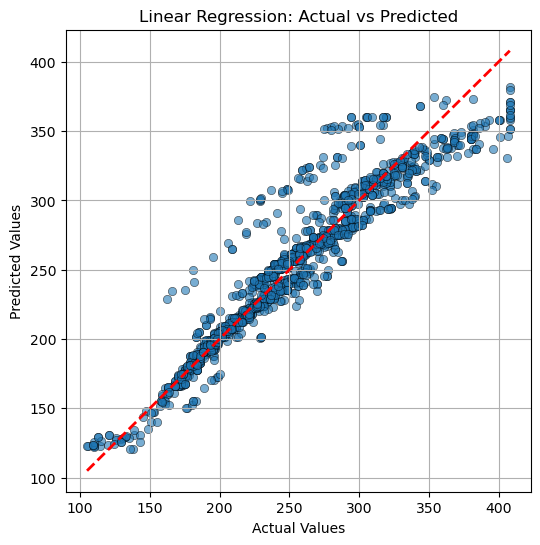

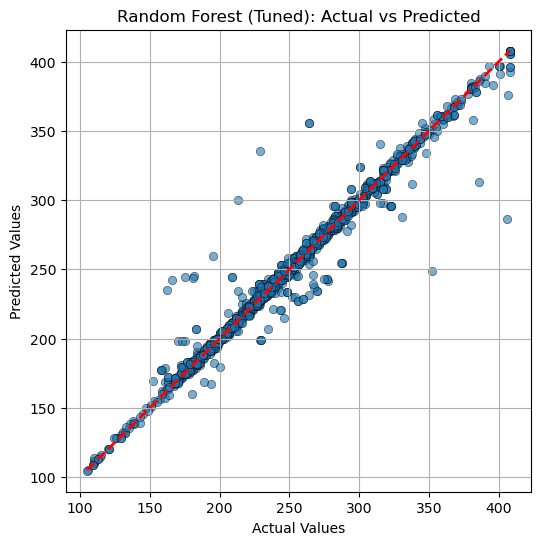

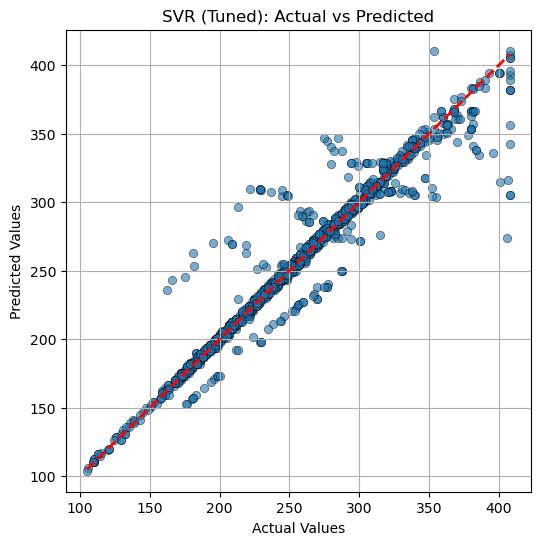

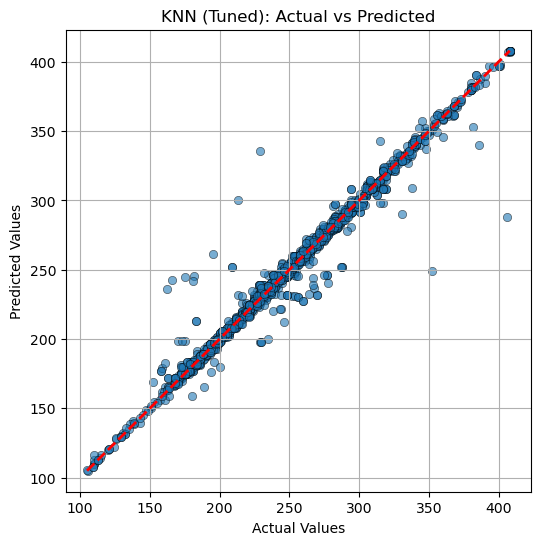

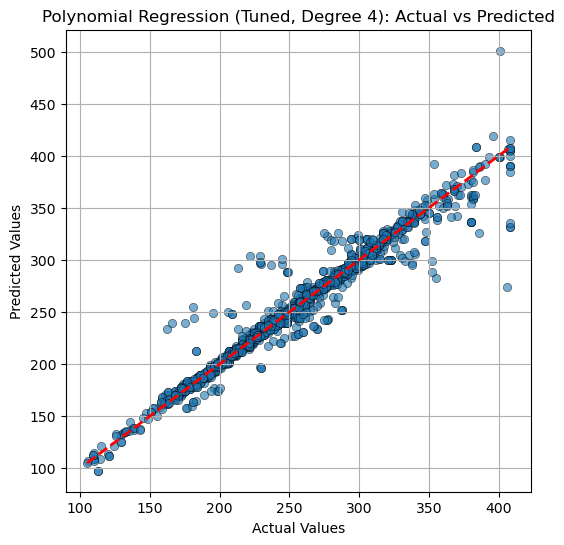

In [120]:
def plot_actual_vs_pred(y_test, y_pred, model_name):
    plt.figure(figsize=(6, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6, edgecolor='k')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', linewidth=2)  # Perfect fit line
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name}: Actual vs Predicted")
    plt.grid()
    plt.show()

# Plot for best models
plot_actual_vs_pred(y_test, y_pred_lr, "Linear Regression")
plot_actual_vs_pred(y_test, y_pred_rf_tune, "Random Forest (Tuned)")
plot_actual_vs_pred(y_test, y_pred_svr_tune, "SVR (Tuned)")
plot_actual_vs_pred(y_test, y_pred_knn_tune, "KNN (Tuned)")
plot_actual_vs_pred(y_test, y_pred_poly, "Polynomial Regression (Tuned, Degree 4)")

### **Residual Distribution**

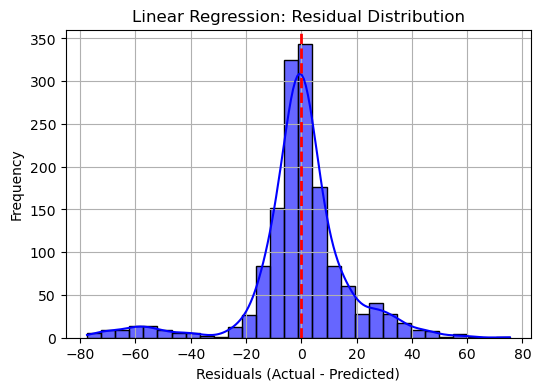

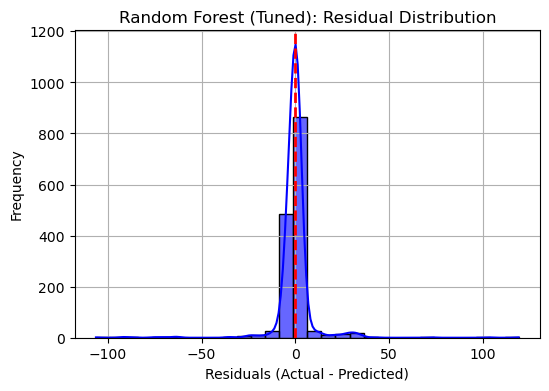

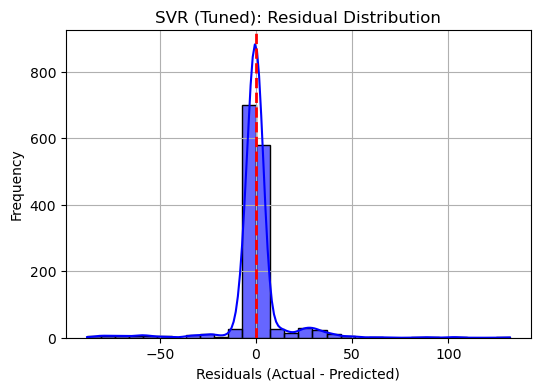

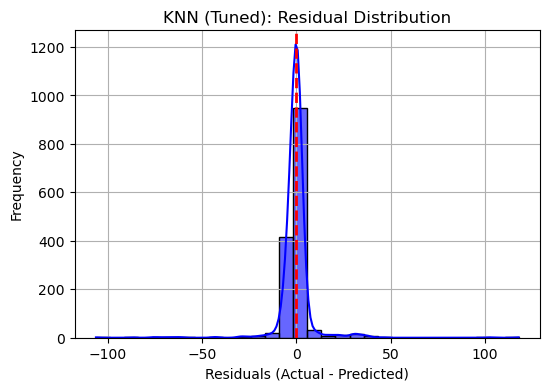

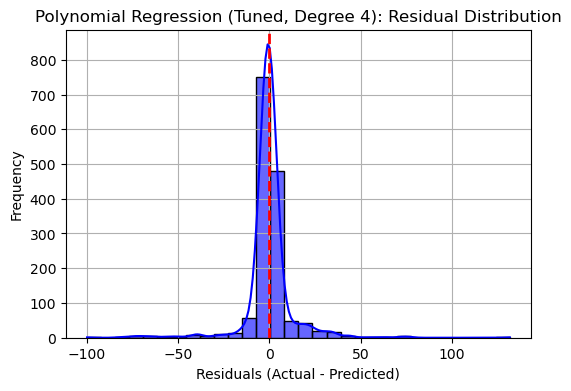

In [121]:
def plot_residuals(y_test, y_pred, model_name):
    residuals = y_test - y_pred
    plt.figure(figsize=(6, 4))
    sns.histplot(residuals, kde=True, bins=30, color="blue", alpha=0.6)
    plt.axvline(0, color='red', linestyle='dashed', linewidth=2)  # Zero residual line
    plt.xlabel("Residuals (Actual - Predicted)")
    plt.ylabel("Frequency")
    plt.title(f"{model_name}: Residual Distribution")
    plt.grid()
    plt.show()

# Plot residuals for best models
plot_residuals(y_test,y_pred_lr,"Linear Regression")
plot_residuals(y_test, y_pred_rf_tune, "Random Forest (Tuned)")
plot_residuals(y_test, y_pred_svr_tune, "SVR (Tuned)")
plot_residuals(y_test, y_pred_knn_tune, "KNN (Tuned)")
plot_residuals(y_test, y_pred_poly, "Polynomial Regression (Tuned, Degree 4)")

###  **Box Plot Comparison of Errors**

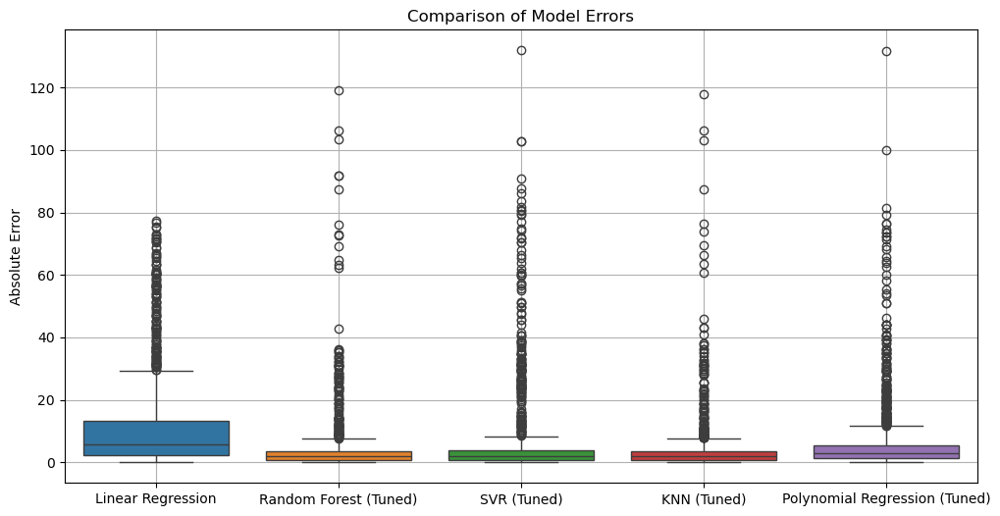

In [122]:
errors_df = pd.DataFrame({
    "Linear Regression": abs(y_test - y_pred_lr),
    "Random Forest (Tuned)": abs(y_test - y_pred_rf_tune),
    "SVR (Tuned)": abs(y_test - y_pred_svr_tune),
    "KNN (Tuned)": abs(y_test - y_pred_knn_tune),
    "Polynomial Regression (Tuned)":abs(y_test - y_pred_poly)

})

plt.figure(figsize=(12, 6))
sns.boxplot(data=errors_df)
plt.ylabel("Absolute Error")
plt.title("Comparison of Model Errors")
plt.grid()
plt.show()


Based on the comparison of model errors,

* Random Forest (Tuned), SVR (Tuned), KNN (Tuned), and Polynomial Regression (Tuned) are better choices for deployment compared to Linear Regression.
  
* These models exhibit significantly lower absolute errors and less variability, as shown in the boxplot. 

Considerations for choosing a model:

Accuracy:
Random Forest, SVR, KNN and Polynomial Regression provide better accuracy due to their lower error rates. 

Complexity:
Linear Regression is simpler and faster but may not capture complex relationships in the data. 

**We are Choosing Random Forest for Deployment**

# **MODEL DEPLOYMENT**

In [123]:
import pickle
import joblib

# Save the best model 
joblib.dump(rf_tuned, "co2_model.pkl")

print("Model saved successfully !")


Model saved successfully !
